# Load Package

In [2]:
import gc

import pandas as pd
import numpy as np
import polars as pl
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from IPython.display import display
from sklearn.preprocessing import PowerTransformer, QuantileTransformer
from scipy.stats import norm
from scipy.special import ndtri
from joblib import Parallel, delayed

# Dataset Info.

* train.parquet [파일] :
    * 총 10,704,179개 샘플
    * 총 119개 ('clicked' Target 컬럼 포함) 컬럼 존재
        * gender : 성별
        * age_group : 연령 그룹
        * inventory_id : 지면 ID
        * day_of_week : 주번호
        * hour : 시간
        * seq : 유저 서버 로그 시퀀스
        * l_feat_* : 속성 정보 피처 (l_feat_14는 Ads set)
        * feat_e_* : 정보영역 e 피처
        * feat_d_* : 정보영역 d 피처
        * feat_c_* : 정보영역 c 피처
        * feat_b_* : 정보영역 b 피처
        * feat_a_* : 정보영역 a 피처
        * history_a_* : 과거 인기도 피처
        * history_b_* : 과거 피처
        * clicked : 클릭 여부 (Label)


* test.parquet [파일] :
    * 총 1,527,298개 샘플
    * 총 118개 ('ID' 식별자 컬럼 포함) 컬럼 존재
        * ID : 샘플 식별자
        * gender : 성별
        * age_group : 연령 그룹
        * inventory_id : 지면 ID
        * day_of_week : 주번호
        * hour : 시간
        * seq : 유저 서버 로그 시퀀스
        * l_feat_* : 속성 정보 피처 (l_feat_14는 Ads set)
        * feat_e_* : 정보영역 e 피처
        * feat_d_* : 정보영역 d 피처
        * feat_c_* : 정보영역 c 피처
        * feat_b_* : 정보영역 b 피처
        * feat_a_* : 정보영역 a 피처
        * history_a_* : 과거 인기도 피처
        * history_b_* : 과거 피처


* sample_submission.csv [파일] - 제출 양식  
    * 총 1,527,298개 샘플
        * ID : 샘플 식별자
        * clicked : 광고를 클릭할 확률 (0 ~ 1)

# Get Data

In [3]:
sample_df = pd.read_csv("../data/raw/sample_submission.csv")
print("Sample shape:", sample_df.shape)

Sample shape: (1527298, 2)


In [4]:
train = pl.read_parquet("../data/raw/train.parquet")
test= pl.read_parquet("../data/raw/test.parquet")
print("Train shape:", train.shape)
print("Test shape:", test.shape)

Train shape: (10704179, 119)
Test shape: (1527298, 119)


In [5]:
# 변수 데이터타입 정리
train_rawdf = train.with_columns([
    pl.col("gender").cast(pl.Categorical),
    pl.col("age_group").cast(pl.Categorical),
    pl.col("inventory_id").cast(pl.Categorical),
    pl.col("day_of_week").cast(pl.Int16),
    pl.col("hour").cast(pl.Int16)
])

test_rawdf = test.with_columns([
    pl.col("gender").cast(pl.Categorical),
    pl.col("age_group").cast(pl.Categorical),
    pl.col("inventory_id").cast(pl.Categorical),
    pl.col("day_of_week").cast(pl.Int16),
    pl.col("hour").cast(pl.Int16)
])

In [6]:
train_rawdf.head(5)
# train_rawdf.schema

gender,age_group,inventory_id,day_of_week,hour,seq,l_feat_1,l_feat_2,l_feat_3,l_feat_4,l_feat_5,l_feat_6,l_feat_7,l_feat_8,l_feat_9,l_feat_10,l_feat_11,l_feat_12,l_feat_13,l_feat_14,l_feat_15,l_feat_16,l_feat_17,l_feat_18,l_feat_19,l_feat_20,l_feat_21,l_feat_22,l_feat_23,l_feat_24,l_feat_25,l_feat_26,l_feat_27,feat_e_1,feat_e_2,feat_e_3,feat_e_4,…,history_a_2,history_a_3,history_a_4,history_a_5,history_a_6,history_a_7,history_b_1,history_b_2,history_b_3,history_b_4,history_b_5,history_b_6,history_b_7,history_b_8,history_b_9,history_b_10,history_b_11,history_b_12,history_b_13,history_b_14,history_b_15,history_b_16,history_b_17,history_b_18,history_b_19,history_b_20,history_b_21,history_b_22,history_b_23,history_b_24,history_b_25,history_b_26,history_b_27,history_b_28,history_b_29,history_b_30,clicked
cat,cat,cat,i16,i16,str,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,…,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,i32
"""1.0""","""7.0""","""36""",5,13,"""9,18,269,516,57,97,527,74,317,…",1.0,2.0,1.0,23.0,1.0,1.0,193.0,2.0,50.0,118.0,743.0,2877.0,2.0,1591.0,1058.0,2.0,50.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,5.0,2.0,65.0,-4230.666504,23.863636,-0.05,…,-0.055556,0.02439,-326.857147,-0.014493,-183.285721,-13.596154,0.115821,0.138626,0.047507,0.050622,0.026479,0.001558,0.024922,0.051401,0.004673,0.021028,0.072428,0.007009,0.028816,0.05841,0.000779,0.072428,0.016355,0.011682,0.010124,0.002336,0.008567,0.070092,0.070092,0.011682,0.004673,0.087226,0.049843,0.015576,0.040498,0.051401,0
"""1.0""","""7.0""","""2""",5,8,"""9,144,269,57,516,97,527,74,315…",2.0,2.0,3.0,17.0,193.0,116.0,164.0,2.0,14.0,109.0,674.0,218.0,2.0,122.0,751.0,1.0,14.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,16.0,1.0,65.0,-1346.648193,4.545455,-0.05,…,0.0,0.0,-382.285706,0.0,-176.0,-11.442307,0.068794,0.072179,0.049471,0.052715,0.027574,0.001622,0.025952,0.053526,0.004866,0.021897,0.075423,0.007299,0.030007,0.060825,0.000811,0.075423,0.017031,0.012165,0.010543,0.002433,0.008921,0.07299,0.07299,0.012165,0.004866,0.045416,0.051904,0.01622,0.042172,0.026763,0
"""1.0""","""7.0""","""36""",5,11,"""269,516,57,97,165,527,74,77,31…",1.0,2.0,1.0,7.0,675.0,85.0,227.0,2.0,362.0,212.0,1029.0,3916.0,1.0,2924.0,2304.0,2.0,362.0,3.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,16.0,1.0,64.638885,-3195.388916,22.727272,-0.05,…,-0.111111,0.097561,-409.0,-0.014493,-224.714279,-13.942307,0.112947,0.169634,0.038753,0.041295,0.0216,0.001271,0.02033,0.04193,0.003812,0.017153,0.059083,0.005718,0.023506,0.047647,0.000635,0.059083,0.026683,0.00953,0.008259,0.001906,0.006988,0.057177,0.057177,0.00953,0.003812,0.035577,0.081318,0.012706,0.033036,0.062898,0
"""1.0""","""8.0""","""37""",5,11,"""269,57,516,21,214,269,561,214,…",2.0,2.0,2.0,7.0,294.0,442.0,130.0,2.0,163.0,179.0,102.0,789.0,2.0,2169.0,439.0,1.0,163.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,4.0,1.0,65.0,-4029.962891,3.863636,-0.05,…,-0.055556,0.02439,-274.428558,-0.014493,-127.85714,-9.846154,0.159843,0.198657,0.068082,0.072546,0.037947,0.002232,0.035715,0.073663,0.006697,0.030135,0.103797,0.010045,0.041296,0.083707,0.002232,0.103797,0.023438,0.016741,0.014509,0.003348,0.012277,0.100449,0.100449,0.016741,0.006697,0.062502,0.07143,0.022322,0.058037,0.073659,0
"""2.0""","""7.0""","""37""",5,7,"""144,269,57,516,35,479,57,516,5…",2.0,2.0,3.0,24.0,497.0,435.0,171.0,2.0,193.0,131.0,690.0,110.0,1.0,2084.0,106.0,1.0,193.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,15.0,4.0,65.0,-2106.407471,8.522727,-0.05,…,0.0,0.0,-407.571442,0.0,-199.142853,-14.019231,0.056166,0.063795,0.043725,0.046592,0.024371,0.001434,0.022938,0.047309,0.004301,0.019354,0.066662,0.006451,0.026522,0.05376,0.000717,0.066662,0.015053,0.010752,0.009318,0.00215,0.007885,0.064512,0.064512,0.010752,0.004301,0.040141,0.045875,0.014336,0.037274,0.023654,0


In [7]:
test_rawdf.head(5)
# test_rawdf.schema

ID,gender,age_group,inventory_id,day_of_week,hour,seq,l_feat_1,l_feat_2,l_feat_3,l_feat_4,l_feat_5,l_feat_6,l_feat_7,l_feat_8,l_feat_9,l_feat_10,l_feat_11,l_feat_12,l_feat_13,l_feat_14,l_feat_15,l_feat_16,l_feat_17,l_feat_18,l_feat_19,l_feat_20,l_feat_21,l_feat_22,l_feat_23,l_feat_24,l_feat_25,l_feat_26,l_feat_27,feat_e_1,feat_e_2,feat_e_3,…,history_a_1,history_a_2,history_a_3,history_a_4,history_a_5,history_a_6,history_a_7,history_b_1,history_b_2,history_b_3,history_b_4,history_b_5,history_b_6,history_b_7,history_b_8,history_b_9,history_b_10,history_b_11,history_b_12,history_b_13,history_b_14,history_b_15,history_b_16,history_b_17,history_b_18,history_b_19,history_b_20,history_b_21,history_b_22,history_b_23,history_b_24,history_b_25,history_b_26,history_b_27,history_b_28,history_b_29,history_b_30
str,cat,cat,cat,i16,i16,str,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,…,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
"""TEST_0000000""","""2.0""","""6.0""","""46""",7,13,"""321,269,57,516,479,516,57,479,…",2.0,2.0,2.0,19.0,1047.0,161.0,265.0,2.0,232.0,96.0,1513.0,4944.0,2.0,2065.0,1713.0,1.0,232.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1674.0,16.0,1.0,65.0,-2554.314697,15.909091,…,0.060337,-0.166667,0.060976,-355.0,-0.043478,-180.428574,-13.326923,0.236312,0.281649,0.048257,0.051422,0.026897,0.001582,0.025315,0.052213,0.004747,0.02136,0.073572,0.014241,0.029271,0.059333,0.000791,0.073572,0.016613,0.011866,0.010284,0.00712,0.008702,0.071199,0.071199,0.011866,0.004747,0.044302,0.05063,0.015822,0.041137,0.104432
"""TEST_0000001""","""2.0""","""8.0""","""29""",7,21,"""57,35,479,57,463,212,193,151,4…",2.0,2.0,2.0,7.0,1024.0,297.0,47.0,2.0,220.0,57.0,1422.0,4758.0,1.0,1082.0,675.0,1.0,220.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,15.0,1.0,65.0,-684.240723,6.818182,…,0.024875,0.0,0.0,-143.428574,0.0,-63.857143,-3.942308,0.19903,0.198657,0.136158,0.145086,0.075891,0.004464,0.071427,0.147319,0.013393,0.060267,0.207585,0.020089,0.082588,0.167407,0.002232,0.207585,0.046874,0.033482,0.029017,0.006696,0.024553,0.200889,0.200889,0.033482,0.013393,0.124998,0.142854,0.044642,0.116069,0.073659
"""TEST_0000002""","""1.0""","""6.0""","""37""",7,19,"""57,516,97,74,527,77,318,315,31…",2.0,2.0,3.0,7.0,562.0,107.0,63.0,2.0,118.0,157.0,90.0,2100.0,2.0,1337.0,1329.0,1.0,118.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,11.0,1.0,64.638885,-2239.722168,4.318182,…,0.031765,0.0,0.0,-112.285713,0.0,-72.14286,-5.173077,0.151852,0.175891,0.120554,0.128459,0.067194,0.003953,0.063242,0.130436,0.011858,0.05336,0.183796,0.017787,0.073123,0.148223,0.001976,0.183796,0.041502,0.029645,0.025692,0.005929,0.021739,0.177867,0.177867,0.029645,0.011858,0.110673,0.126483,0.039526,0.102768,0.065218
"""TEST_0000003""","""2.0""","""7.0""","""41""",7,9,"""144,321,57,479,57,479,35,57,51…",2.0,2.0,2.0,7.0,444.0,56.0,212.0,2.0,171.0,36.0,481.0,2377.0,1.0,102.0,1157.0,1.0,171.0,4.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,1.0,5.0,64.638885,-1097.240723,11.363636,…,0.02606,-0.055556,0.02439,-411.0,-0.014493,-237.428574,-17.76923,0.08865,0.107031,0.036679,0.039085,0.020444,0.001203,0.019242,0.039686,0.003608,0.016235,0.055921,0.005412,0.022248,0.045098,0.000601,0.055921,0.012627,0.009019,0.007817,0.001804,0.006614,0.108234,0.054117,0.009019,0.003608,0.033673,0.038483,0.012026,0.031268,0.039686
"""TEST_0000004""","""1.0""","""8.0""","""2""",7,18,"""269,57,516,342,516,403,173,457…",2.0,2.0,3.0,8.0,709.0,738.0,22.0,2.0,338.0,100.0,1153.0,3886.0,2.0,2930.0,2381.0,1.0,338.0,3.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,8.0,1.0,65.0,-3665.592529,2.272727,…,0.091343,-0.055556,0.146341,-508.142853,0.0,-240.428574,-16.73077,0.047072,0.105696,0.036222,0.038597,0.020189,0.001188,0.019002,0.039191,0.003563,0.016033,0.055223,0.010688,0.021971,0.044535,0.000594,0.055223,0.01247,0.008907,0.007719,0.001781,0.006532,0.053442,0.053442,0.008907,0.003563,0.033253,0.038003,0.0

# Categorical Value Check

In [8]:
FLOAT_DTYPES  = {pl.Float32, pl.Float64}
INT_DTYPES    = {pl.Int8, pl.Int16, pl.Int32, pl.Int64, pl.UInt8, pl.UInt16, pl.UInt32, pl.UInt64}

FORCE_CAT  = set()
FORCE_CONT = set()

def _is_float_dtype(dtype) -> bool:
    return dtype in FLOAT_DTYPES

def _is_int_dtype(dtype) -> bool:
    return dtype in INT_DTYPES

# 뒤의 Other features 처리 위해 추가
TRANS_SUFFIXES = (
    "_w_log1p","_w_asinh","_w_logit","_w_robust","_w_rg",
    "_w_sqrt","_w_square","_w_bc","_w_yj","_w_quantile",
    "_log1p","_asinh","_logit","_robust","_rg",
    "_sqrt","_square","_bc","_yj","_quantile",
)

def _float_is_integer_like(series: pl.Series, sample=50000, tol=1e-9):
    vals = series.drop_nulls().head(sample).to_numpy()
    if vals.size == 0:
        return False
    return np.allclose(vals, np.round(vals), atol=tol)


def is_categorical_feature(df, col, threshold=30, cardinality_ratio=2e-5):
    if col in FORCE_CAT:  return True
    if col in FORCE_CONT: return False

    dtype = df[col].dtype

    # 1) 변환 컬럼(이름 기반) + 실수형은 무조건 연속형
    if _is_float_dtype(dtype) and any(sfx in col for sfx in TRANS_SUFFIXES):
        return False

    n_total  = df.height
    n_unique = df[col].n_unique()  # big-N에서도 빠름

    # 2) 실수형 컬럼은 기본적으로 연속형.
    #    다만 '정수처럼 보이고' + '저카디널(<=min(10, threshold))'일 때만 카테고리 취급
    if _is_float_dtype(dtype):
        if n_unique <= min(10, threshold) and _float_is_integer_like(df[col]):
            return True
        return False

    # 3) 정수/문자열 등은 '저카디널 & 아주 낮은 비율'을 동시에 만족할 때만 카테고리
    if n_unique <= threshold:
        return True
    if (n_unique / n_total) <= cardinality_ratio:
        return True

    return False

In [ ]:
# categorical feature 판별
common_cols = [c for c in train.columns if c in test.columns and c != "clicked"]
cat_cols = [c for c in common_cols if is_categorical_feature(train, c)]

print("Categorical columns:", cat_cols)

# 각 categorical column에 대해 train/test 값 비교
for col in cat_cols:
    train_vals = set(train[col].unique().to_list())
    test_vals  = set(test[col].unique().to_list())

    new_in_test = test_vals - train_vals
    missing_in_test = train_vals - test_vals

    print(f"\n[{col}]")
    print(f"  Train unique: {len(train_vals)}")
    print(f"  Test unique : {len(test_vals)}")
    if new_in_test:
        print(f"  ⚠️ New categories in test: {list(new_in_test)[:20]}")
    else:
        print("  ✅ No new categories in test")

    if missing_in_test:
        print(f"  (Train only categories: {list(missing_in_test)[:20]})")

Categorical columns: ['gender', 'age_group', 'inventory_id', 'day_of_week', 'hour', 'l_feat_1', 'l_feat_2', 'l_feat_3', 'l_feat_8', 'l_feat_13', 'l_feat_16', 'l_feat_18', 'l_feat_19', 'l_feat_20', 'l_feat_21', 'l_feat_22', 'l_feat_23', 'l_feat_24', 'l_feat_27', 'feat_a_8', 'feat_a_9']

[gender]
  Train unique: 3
  Test unique : 3
  ✅ No new categories in test

[age_group]
  Train unique: 9
  Test unique : 9
  ✅ No new categories in test

[inventory_id]
  Train unique: 18
  Test unique : 18
  ✅ No new categories in test

[day_of_week]
  Train unique: 7
  Test unique : 1
  ✅ No new categories in test
  (Train only categories: ['3', '5', '6', '2', '1', '4'])

[hour]
  Train unique: 24
  Test unique : 24
  ✅ No new categories in test

[l_feat_1]
  Train unique: 2
  Test unique : 2
  ✅ No new categories in test

[l_feat_2]
  Train unique: 3
  Test unique : 3
  ✅ No new categories in test

[l_feat_3]
  Train unique: 3
  Test unique : 3
  ✅ No new categories in test

[l_feat_8]
  Train unique

: 

# EDA by Column

In [9]:
# Click rate Confidence Interval 표시 함수 추가 (95% CI)
def wilson_bounds(p, n, z=1.96):
    n = np.asarray(n, dtype=float)
    p = np.asarray(p, dtype=float)
    with np.errstate(divide="ignore", invalid="ignore"):
        denom = 1 + (z**2)/n
        center = (p + (z**2)/(2*n)) / denom
        half = z * np.sqrt((p*(1-p)/n) + (z**2)/(4*n*n)) / denom
        lower = np.clip(center - half, 0, 1)
        upper = np.clip(center + half, 0, 1)
    return lower, upper

## gender, age_group, inventory_id, day_of_week, hour, clicked
- gender
  - 1: 남성, 2: 여성 (사이트 분석)
- age_group
  - 8: 10대, 7: 20대, ... (사이트 분석)
- inventory_id
  - 지면 id
- day_of_week
  - 1: 일요일, 7: 토요일 (데이터 분석)

In [19]:
# print(train_rawdf["gender"].value_counts())
# print(train_rawdf["age_group"].value_counts())
# print(train_rawdf["inventory_id"].value_counts())
# print(train_rawdf["day_of_week"].value_counts())
# print(train_rawdf["hour"].value_counts())
# print(train_rawdf["clicked"].value_counts())

In [ ]:
def eda_plot(df, col, title = None):
    cnt = (df[col].cast(pl.Utf8).fill_null("NaN").value_counts().rename({col: "value", "count": "count"}))

    cnt_num = cnt.filter(pl.col("value") != "NaN").with_columns(pl.col("value").cast(pl.Float64))
    cnt_nan = cnt.filter(pl.col("value") == "NaN")
    cnt = cnt_num.sort("value").cast({"value": pl.Utf8}).vstack(cnt_nan)

    cnt_pd = cnt.to_pandas()

    try:
        cnt_pd["value"] = cnt_pd["value"].replace("NaN", None).astype(float).astype(str)
    except Exception:
        pass

    # display(cnt_pd)
    
    n = len(cnt_pd)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(max(12, 6 + 0.5*n), 6), gridspec_kw={"width_ratios": [2, 1]})

    sns.barplot(data=cnt_pd, x="value", y="count", ax=ax1)
    ax1.set_xlabel(col)
    ax1.set_ylabel("Count")
    ax1.set_title(title or f"Distribution of {col}")
    ax1.tick_params(axis="x", rotation=45)
    plt.setp(ax1.get_xticklabels(), ha="right")
    ax1.grid(axis="y", linestyle="--", alpha=0.3)

    ax2.axis("off")
    the_table = ax2.table(
        cellText=cnt_pd.values.tolist(),
        colLabels=cnt_pd.columns.tolist(),
        cellLoc="center",
        loc="center"
    )
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(8)
    the_table.scale(1, 1.2)

    plt.tight_layout()
    plt.show()

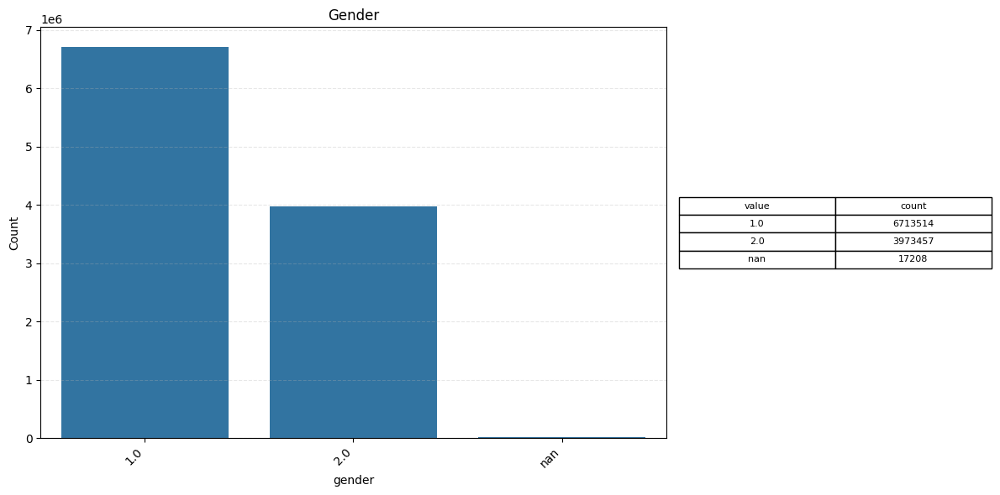

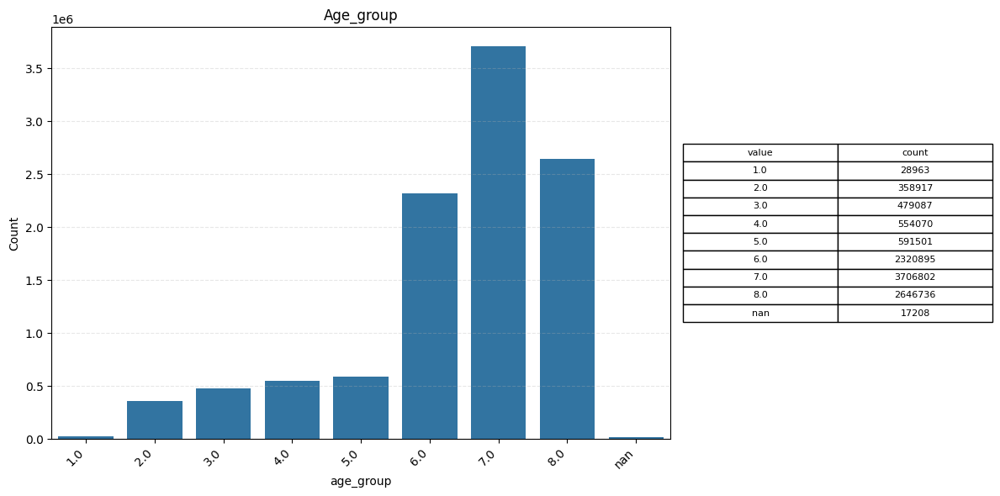

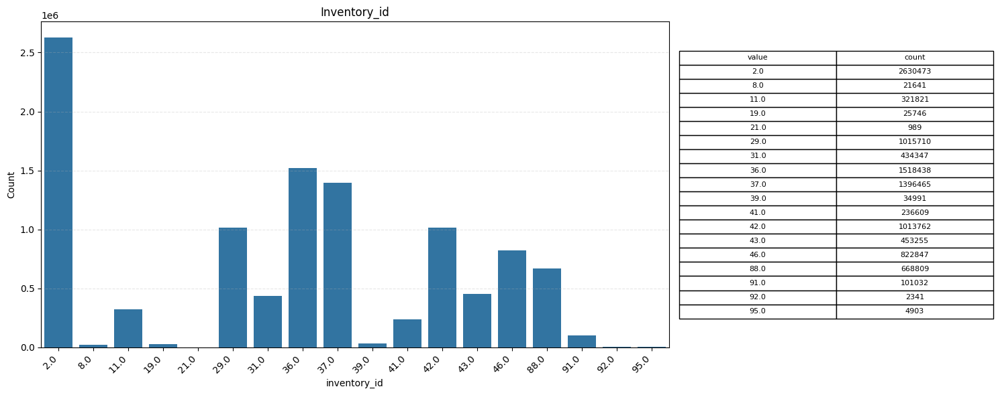

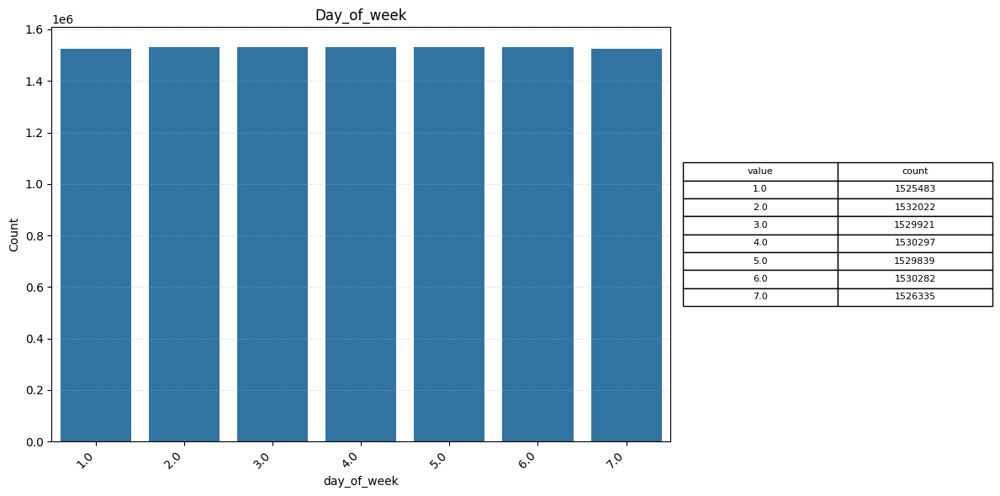

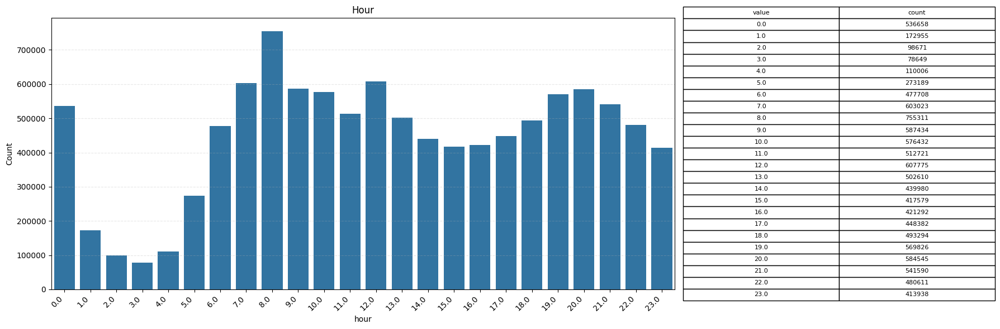

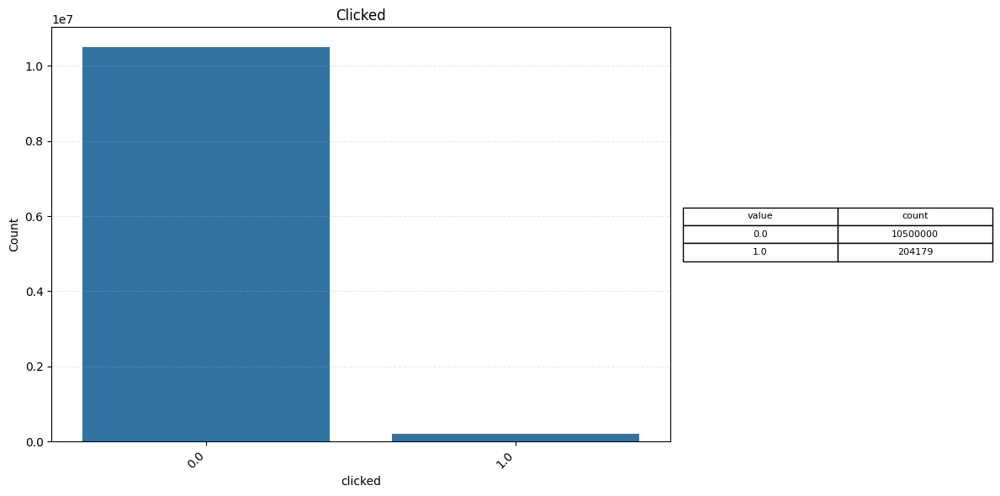

In [ ]:
eda_plot(train_rawdf, "gender", title="Gender")
eda_plot(train_rawdf, "age_group", title="Age_group")
eda_plot(train_rawdf, "inventory_id", title="Inventory_id")
eda_plot(train_rawdf, "day_of_week", title="Day_of_week")
eda_plot(train_rawdf, "hour", title="Hour")
eda_plot(train_rawdf, "clicked", title="Clicked")

In [45]:
def eda_plot_by_clicked(df, col, title=None):
    cnt = df.select([col, "clicked"]).with_columns(pl.col(col).cast(pl.Utf8).fill_null("NaN")).to_pandas()

    pivot_table = (cnt.groupby([col, "clicked"]).size().reset_index(name="count").pivot(index=col, columns="clicked", values="count").fillna(0))
    pivot_table["total"] = pivot_table.sum(axis=1)
    pivot_table["ctr"] = (pivot_table.get(1, 0) / pivot_table["total"]).round(4)

    try:
        pivot_table = pivot_table.sort_index(key=lambda x: x.astype(float))
    except Exception:
        pivot_table = pivot_table.sort_index()

    order = pivot_table.index.tolist()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 8), gridspec_kw={"width_ratios": [2, 1]})

    sns.countplot(data=cnt, x=col, hue="clicked", ax=ax1, order=order)
    ax1.set_xlabel(col)
    ax1.set_ylabel("Count")
    ax1.set_title(title or f"Distribution of {col} by Clicked (log-scaled)")
    ax1.tick_params(axis="x", rotation=45)
    plt.setp(ax1.get_xticklabels(), ha="right")
    ax1.grid(axis="y", linestyle="--", alpha=0.3)
    ax1.set_yscale("log")
    ax1.set_ylim(1, None)

    ax1b = ax1.twinx()
    p = pivot_table.loc[order, "ctr"].values
    n = pivot_table.loc[order, "total"].values
    lower, upper = wilson_bounds(p, n)

    ax1b.plot(order, p, marker="o", color="black", linestyle="-", label="Click rate")
    ax1b.fill_between(order, lower, upper, color="black", alpha=0.3, label="95% CI")
    ax1b.set_ylabel("click rate")
    ctr_min = pivot_table["ctr"].min()
    ctr_max = pivot_table["ctr"].max()
    ax1b.set_ylim(ctr_min*0.8, ctr_max*1.3)
    
    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax1b.get_legend_handles_labels()
    ax1.legend(handles1 + handles2, labels1 + labels2, loc="upper right", bbox_to_anchor=(1.25, 1))
    
    ax2.axis("off")
    table_data = pivot_table.reset_index()
    the_table = ax2.table(cellText=table_data.values.tolist(), colLabels=table_data.columns.tolist(), cellLoc="center", loc="center")
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(8)
    the_table.scale(1, 1.2)

    plt.tight_layout()
    plt.show()


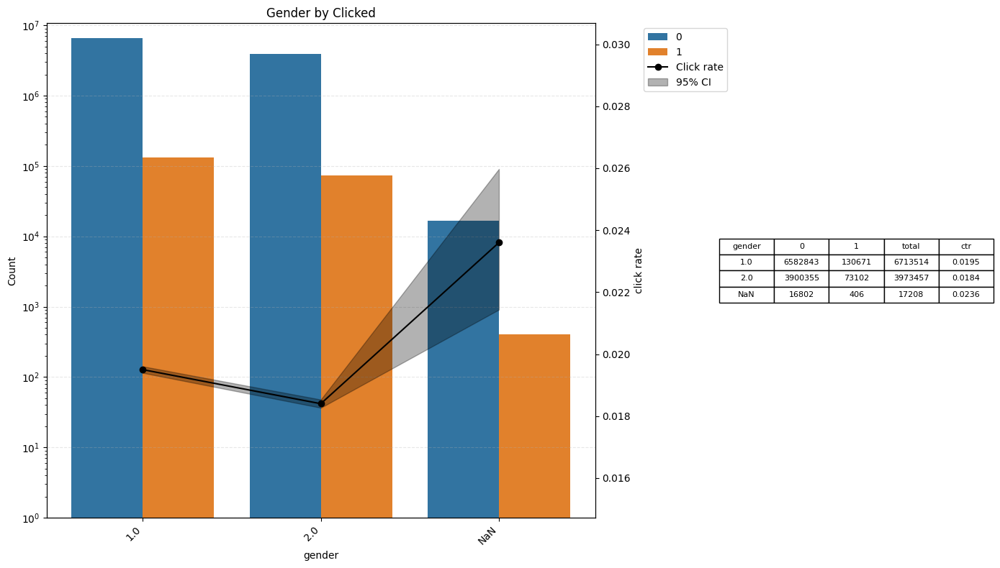

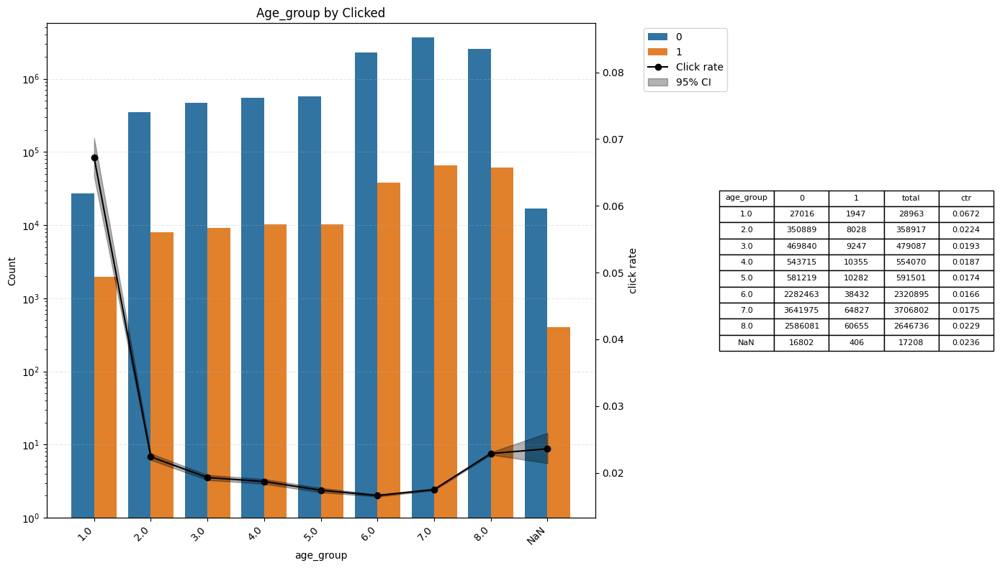

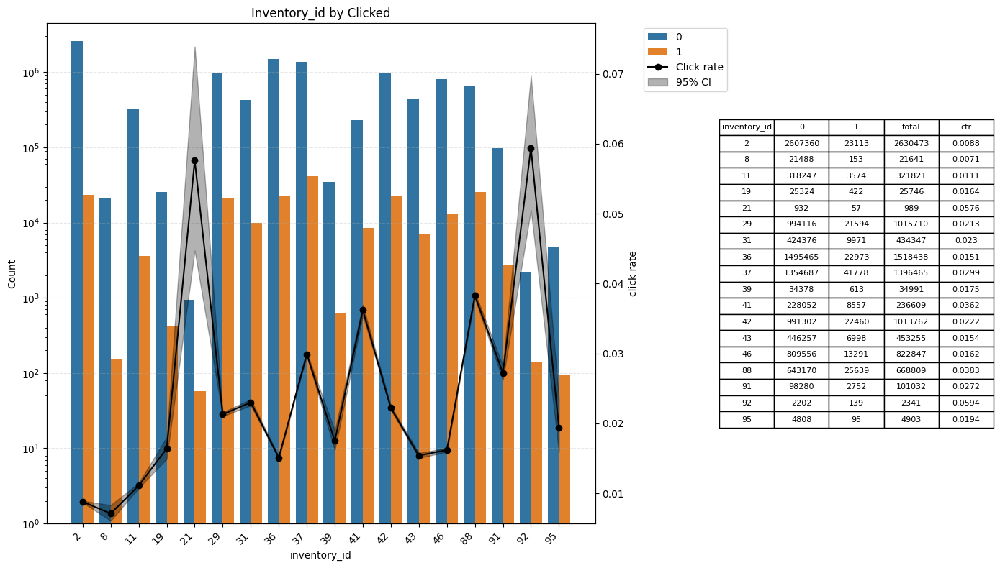

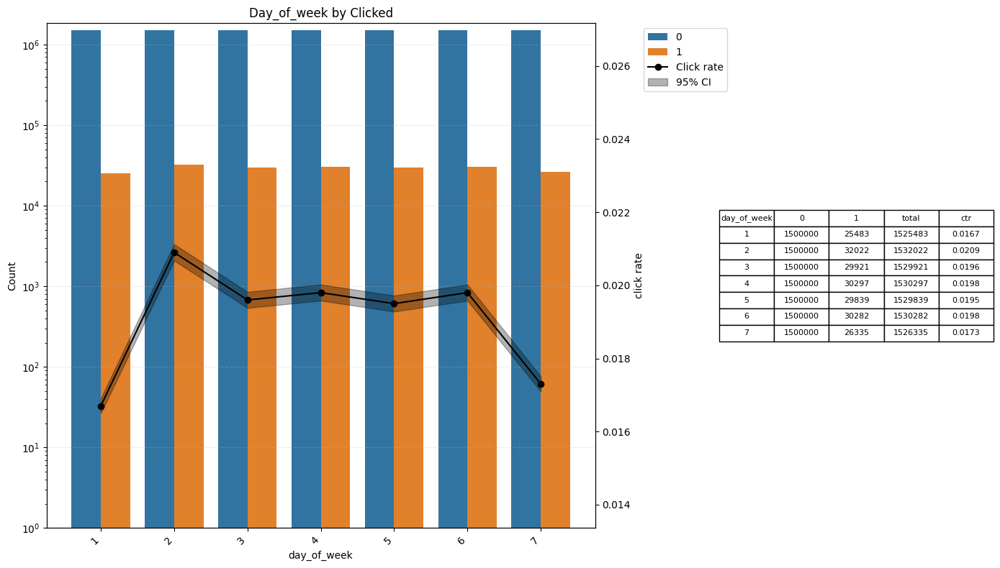

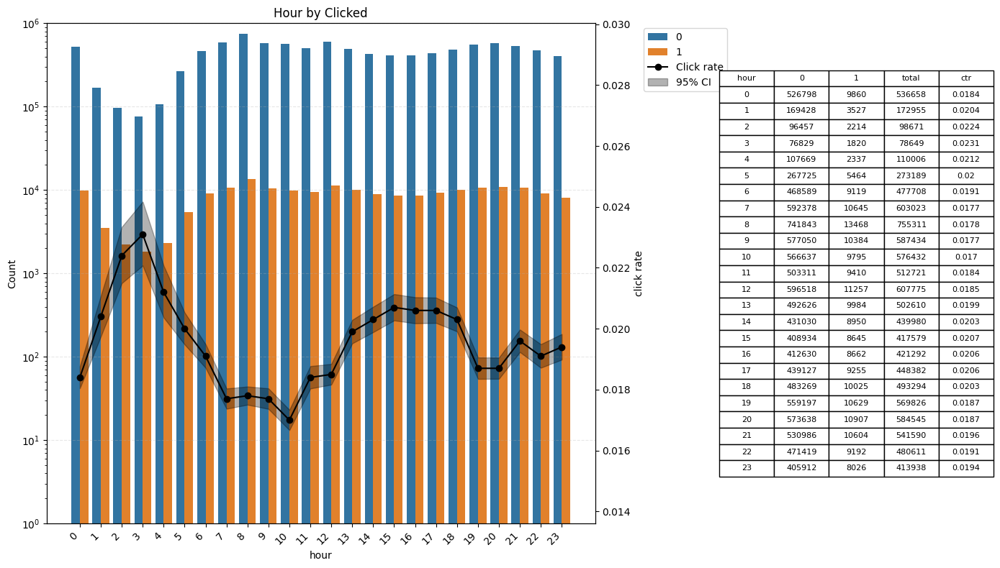

In [46]:
eda_plot_by_clicked(train_rawdf, "gender", "Gender by Clicked")
eda_plot_by_clicked(train_rawdf, "age_group", "Age_group by Clicked")
eda_plot_by_clicked(train_rawdf, "inventory_id", "Inventory_id by Clicked")
eda_plot_by_clicked(train_rawdf, "day_of_week", "Day_of_week by Clicked")
eda_plot_by_clicked(train_rawdf, "hour", "Hour by Clicked")

## seq
- 로그기록 (데이터 분석)

In [25]:
seq = train_rawdf.select(["seq", "clicked"])
print(seq.head(10))

shape: (10, 2)
┌─────────────────────────────────┬─────────┐
│ seq                             ┆ clicked │
│ ---                             ┆ ---     │
│ str                             ┆ i32     │
╞═════════════════════════════════╪═════════╡
│ 9,18,269,516,57,97,527,74,317,… ┆ 0       │
│ 9,144,269,57,516,97,527,74,315… ┆ 0       │
│ 269,516,57,97,165,527,74,77,31… ┆ 0       │
│ 269,57,516,21,214,269,561,214,… ┆ 0       │
│ 144,269,57,516,35,479,57,516,5… ┆ 0       │
│ 9,516,57,527,74,77,532,101,132… ┆ 0       │
│ 9,516,57,221,97,63,520,426,221… ┆ 0       │
│ 57,516,338,416,74,527,77,318,4… ┆ 0       │
│ 57,516,97,165,74,527,317,269,3… ┆ 0       │
│ 9,269,57,516,74,207,452,452,24… ┆ 0       │
└─────────────────────────────────┴─────────┘


shape: (3_672, 2)
┌─────────┬───────┐
│ seq_len ┆ len   │
│ ---     ┆ ---   │
│ u32     ┆ u32   │
╞═════════╪═══════╡
│ 1       ┆ 59300 │
│ 2       ┆ 16240 │
│ 3       ┆ 16665 │
│ 4       ┆ 17581 │
│ 5       ┆ 18667 │
│ …       ┆ …     │
│ 10103   ┆ 2     │
│ 10340   ┆ 1     │
│ 10560   ┆ 3     │
│ 12935   ┆ 1     │
│ 14441   ┆ 1     │
└─────────┴───────┘


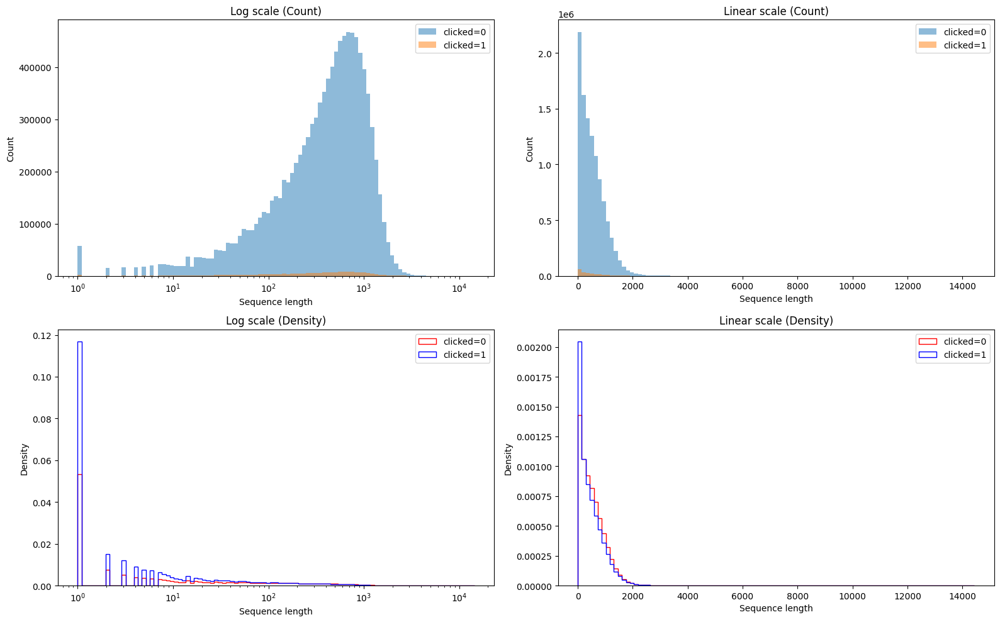

In [26]:
# seq의 길이 확인
seq_len = seq.with_columns((pl.col("seq").str.count_matches(",") + 1).alias("seq_len"))
length_dist = seq_len.group_by("seq_len").len().sort("seq_len")
print(length_dist)

arr0 = seq_len.filter(pl.col("clicked") == 0)["seq_len"].to_numpy()
arr1 = seq_len.filter(pl.col("clicked") == 1)["seq_len"].to_numpy()

# 로그스케일 그래프
bins_log = np.logspace(np.log10(1), np.log10(arr0.max()), 100)
# 일반스케일 그래프
bins_lin = np.linspace(1, arr0.max(), 100)

fig, axes = plt.subplots(2, 2, figsize=(16,10))

axes[0,0].hist(arr0, bins=bins_log, alpha=0.5, label="clicked=0", density=False)
axes[0,0].hist(arr1, bins=bins_log, alpha=0.5, label="clicked=1", density=False)
axes[0,0].set_xscale("log")
axes[0,0].set_title("Log scale (Count)")
axes[0,0].set_xlabel("Sequence length")
axes[0,0].set_ylabel("Count")
axes[0,0].legend()

axes[0,1].hist(arr0, bins=bins_lin, alpha=0.5, label="clicked=0", density=False)
axes[0,1].hist(arr1, bins=bins_lin, alpha=0.5, label="clicked=1", density=False)
axes[0,1].set_title("Linear scale (Count)")
axes[0,1].set_xlabel("Sequence length")
axes[0,1].set_ylabel("Count")
axes[0,1].legend()

axes[1,0].hist(arr0, bins=bins_log, density=True,histtype="step", color="red", label="clicked=0")
axes[1,0].hist(arr1, bins=bins_log, density=True,histtype="step", color="blue", label="clicked=1")
axes[1,0].set_xscale("log")
axes[1,0].set_title("Log scale (Density)")
axes[1,0].set_xlabel("Sequence length")
axes[1,0].set_ylabel("Density")
axes[1,0].legend()

axes[1,1].hist(arr0, bins=bins_lin, density=True,histtype="step", color="red", label="clicked=0")
axes[1,1].hist(arr1, bins=bins_lin, density=True,histtype="step", color="blue", label="clicked=1")
axes[1,1].set_title("Linear scale (Density)")
axes[1,1].set_xlabel("Sequence length")
axes[1,1].set_ylabel("Density")
axes[1,1].legend()

plt.tight_layout()
plt.show()

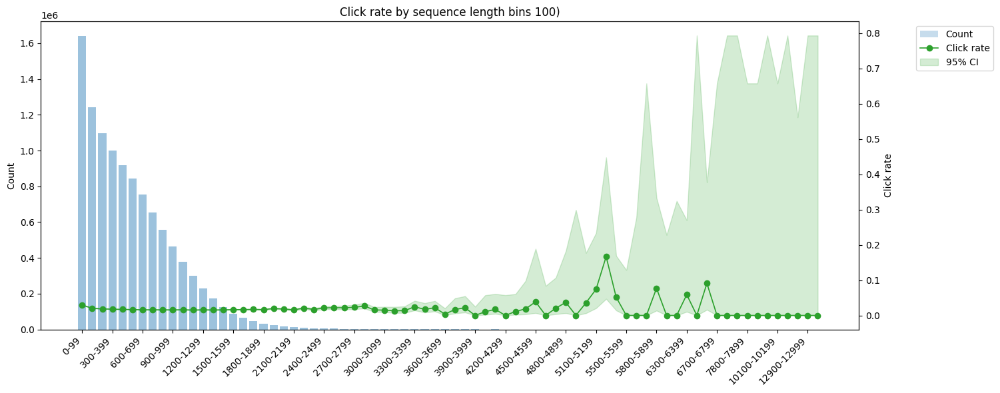

In [ ]:
# seq 길이에 따른 클릭률 확인

seq_len = seq.with_columns((pl.col("seq").str.count_matches(",") + 1).alias("seq_len"))

# bin 설정
BIN_W = 100
max_len = int(seq_len.select(pl.max("seq_len")).item())
last_upper = ((max_len // BIN_W) + 1) * BIN_W

seq_binned = seq_len.with_columns(((pl.col("seq_len") // BIN_W) * BIN_W).alias("bin_start"))
seq_binned = seq_binned.with_columns([(pl.col("bin_start") + BIN_W - 1).alias("bin_end")])
seq_binned = seq_binned.with_columns([(pl.col("bin_start").cast(str) + "-" + pl.col("bin_end").cast(str)).alias("bin")])

# bin별 groupby
agg = seq_binned.group_by(["bin_start", "bin", "clicked"]).len().rename({"len": "count"})
wide = agg.pivot(values="count", index=["bin_start", "bin"], on="clicked").fill_null(0).sort("bin_start")

# 클릭률 계산 및 x축 정렬
rename_map = {}
if "0" in wide.columns: rename_map["0"] = "c0"
if "1" in wide.columns: rename_map["1"] = "c1"
wide = wide.rename(rename_map)
wide = wide.with_columns([(pl.col("c0") + pl.col("c1")).alias("total"), (pl.col("c1") / (pl.col("c0") + pl.col("c1"))).alias("click_rate")])

# 플롯
x = np.arange(len(wide))
bins_txt = wide["bin"].to_list()
n = wide["total"].to_numpy()
p = wide["click_rate"].to_numpy()
lower, upper = wilson_bounds(p, n)

fig, ax1 = plt.subplots(figsize=(15,6))

# 좌측: 클릭 수
ax1.bar(x, n, alpha=0.25)
ax1.set_ylabel("Count")
bar = ax1.bar(x, n, alpha=0.25, color="tab:blue", label="Count")

# 우측: 클릭률
ax2 = ax1.twinx()
line, = ax2.plot(x, p, marker="o", linewidth=1.2, color="tab:green", label="Click rate")
band = ax2.fill_between(x, lower, upper, color="tab:green", alpha=0.2, label="95% CI")
ax2.set_ylabel("Click rate")

# 라벨 표시 제한
step = max(1, len(x)//20)
ax1.set_xticks(x[::step])
ax1.set_xticklabels(bins_txt[::step], rotation=45, ha="right")

# 범례
handles = [bar, line, band]
labels = [h.get_label() for h in handles]
ax1.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.17, 1))

# 제목
plt.title(f"Click rate by sequence length bins {BIN_W})")
plt.tight_layout()
plt.show()


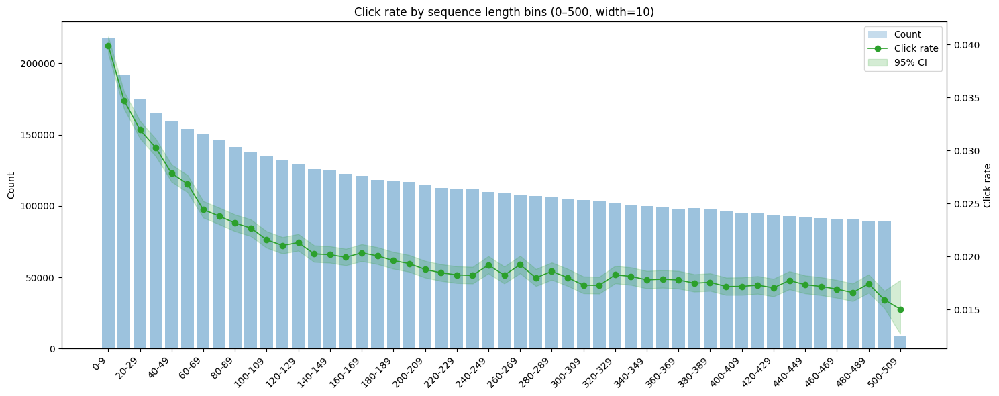

In [ ]:
# 0 <= seq_len <= 500 구간만 살펴보기

BIN_W = 10
max_len = 500

seq_filtered = seq_len.filter(pl.col("seq_len") <= max_len)

seq_binned = seq_filtered.with_columns(((pl.col("seq_len") // BIN_W) * BIN_W).alias("bin_start"))
seq_binned = seq_binned.with_columns([(pl.col("bin_start") + BIN_W - 1).alias("bin_end")])
seq_binned = seq_binned.with_columns([(pl.col("bin_start").cast(str) + "-" + pl.col("bin_end").cast(str)).alias("bin")])

agg = seq_binned.group_by(["bin_start", "bin", "clicked"]).len().rename({"len": "count"})
wide = agg.pivot(values="count", index=["bin_start", "bin"], on="clicked").fill_null(0).sort("bin_start")

rename_map = {}
if "0" in wide.columns: rename_map["0"] = "c0"
if "1" in wide.columns: rename_map["1"] = "c1"
wide = wide.rename(rename_map)

wide = wide.with_columns([
    (pl.col("c0") + pl.col("c1")).alias("total"),
    (pl.col("c1") / (pl.col("c0") + pl.col("c1"))).alias("click_rate")
])

x = np.arange(len(wide))
bins_txt = wide["bin"].to_list()
n = wide["total"].to_numpy()
p = wide["click_rate"].to_numpy()
lower, upper = wilson_bounds(p, n)

fig, ax1 = plt.subplots(figsize=(15,6))
ax1.bar(x, n, alpha=0.25)
ax1.set_ylabel("Count")
bar = ax1.bar(x, n, alpha=0.25, color="tab:blue", label="Count")

ax2 = ax1.twinx()
line, = ax2.plot(x, p, marker="o", linewidth=1.2, color="tab:green", label="Click rate")
band = ax2.fill_between(x, lower, upper, color="tab:green", alpha=0.2, label="95% CI")
ax2.set_ylabel("Click rate")

step = max(1, len(x)//20)
ax1.set_xticks(x[::step])
ax1.set_xticklabels(bins_txt[::step], rotation=45, ha="right")

handles = [bar, line, band]
labels = [h.get_label() for h in handles]
ax1.legend(handles, labels, loc="upper right")

plt.title(f"Click rate by sequence length bins (0-{max_len}, width={BIN_W})")
plt.tight_layout()
plt.show()

In [29]:
r = 10

front_exprs = [pl.col("seq").str.extract(rf"^((?:\d+,){{{i}}})(\d+)", group_index=2).cast(pl.Int32).alias(f"seq_{i+1}") for i in range(r)]
back_exprs = [pl.col("seq").str.extract(rf"(\d+)(?:,\d+){{{k-1}}}$", group_index=1).cast(pl.Int32).alias(f"seq_-{k}") for k in range(1, r+1)]

seq_df = seq.select(front_exprs + back_exprs + ["clicked"])
print(seq_df.head(10))

shape: (10, 21)
┌───────┬───────┬───────┬───────┬───┬────────┬────────┬─────────┬─────────┐
│ seq_1 ┆ seq_2 ┆ seq_3 ┆ seq_4 ┆ … ┆ seq_-8 ┆ seq_-9 ┆ seq_-10 ┆ clicked │
│ ---   ┆ ---   ┆ ---   ┆ ---   ┆   ┆ ---    ┆ ---    ┆ ---     ┆ ---     │
│ i32   ┆ i32   ┆ i32   ┆ i32   ┆   ┆ i32    ┆ i32    ┆ i32     ┆ i32     │
╞═══════╪═══════╪═══════╪═══════╪═══╪════════╪════════╪═════════╪═════════╡
│ 9     ┆ 18    ┆ 269   ┆ 516   ┆ … ┆ 311    ┆ 269    ┆ 317     ┆ 0       │
│ 9     ┆ 144   ┆ 269   ┆ 57    ┆ … ┆ 311    ┆ 269    ┆ 315     ┆ 0       │
│ 269   ┆ 516   ┆ 57    ┆ 97    ┆ … ┆ 452    ┆ 77     ┆ 527     ┆ 0       │
│ 269   ┆ 57    ┆ 516   ┆ 21    ┆ … ┆ 479    ┆ 469    ┆ 317     ┆ 0       │
│ 144   ┆ 269   ┆ 57    ┆ 516   ┆ … ┆ 317    ┆ 77     ┆ 74      ┆ 0       │
│ 9     ┆ 516   ┆ 57    ┆ 527   ┆ … ┆ 77     ┆ 74     ┆ 101     ┆ 0       │
│ 9     ┆ 516   ┆ 57    ┆ 221   ┆ … ┆ 227    ┆ 193    ┆ 463     ┆ 0       │
│ 57    ┆ 516   ┆ 338   ┆ 416   ┆ … ┆ 416    ┆ 57     ┆ 479     ┆ 0     

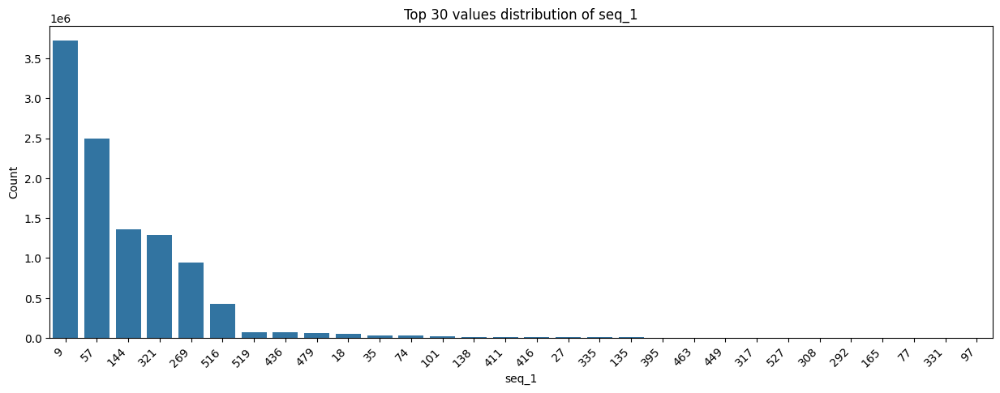

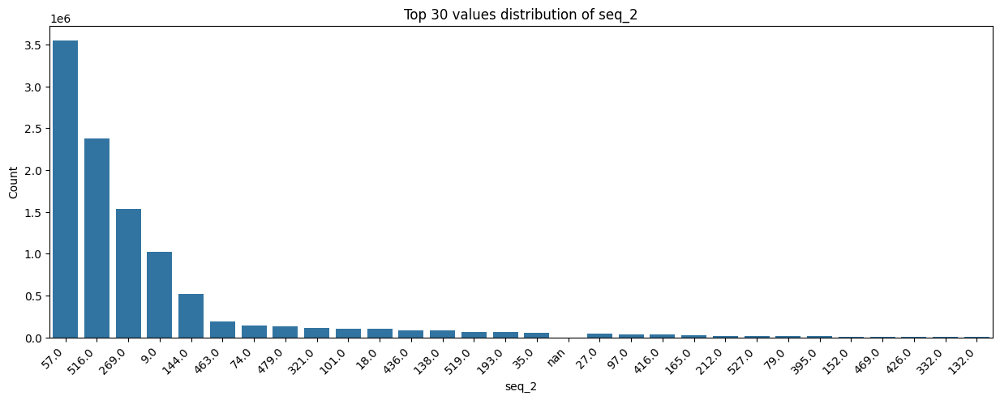

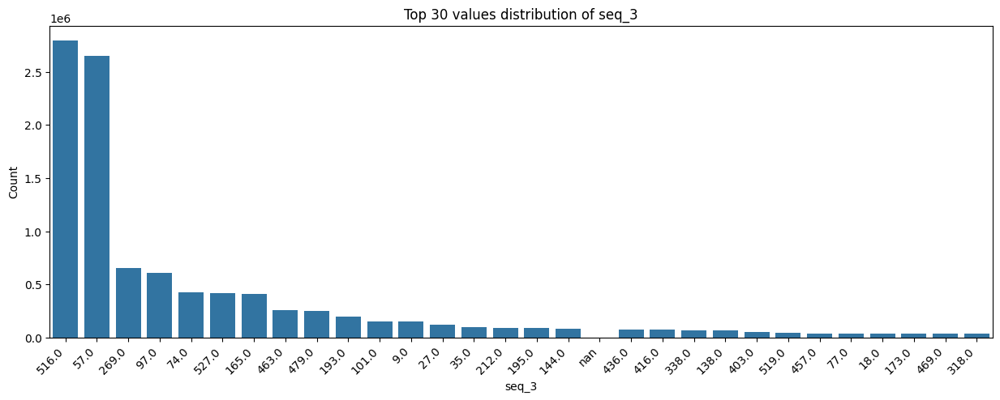

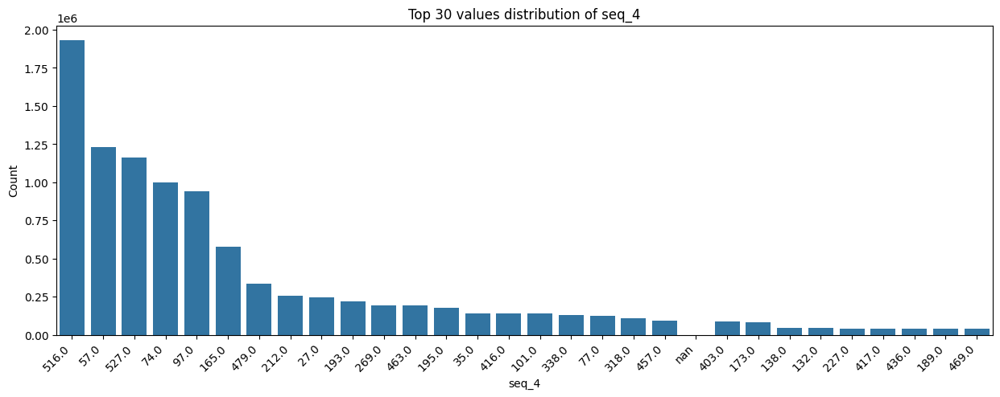

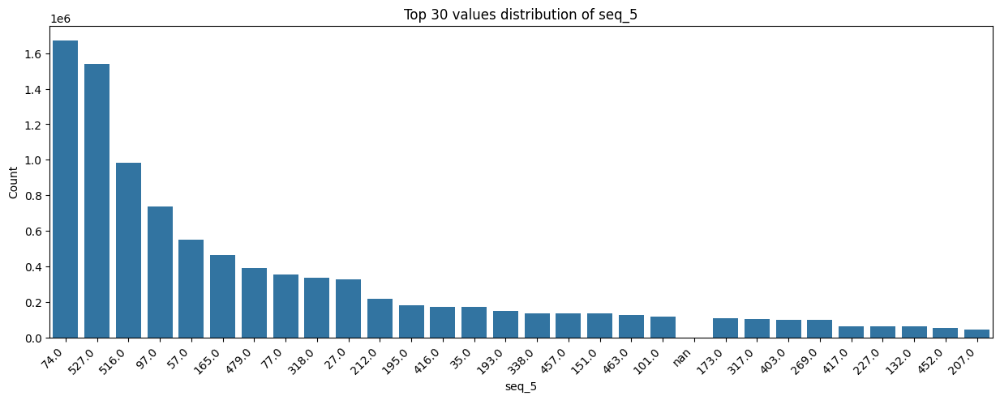

...

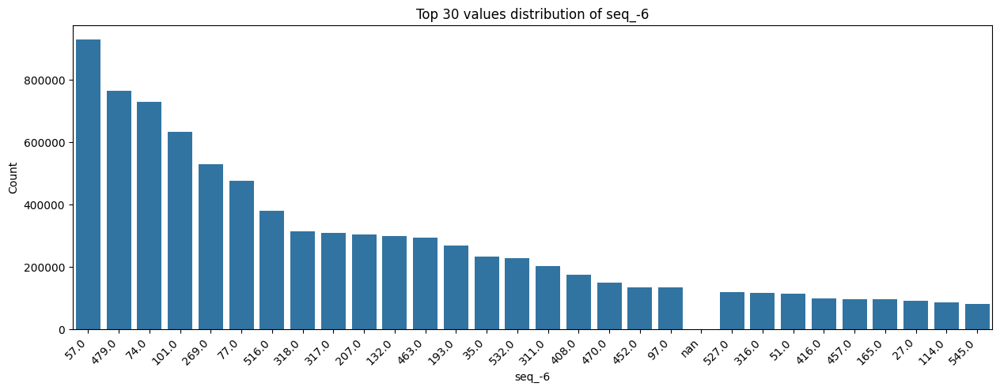

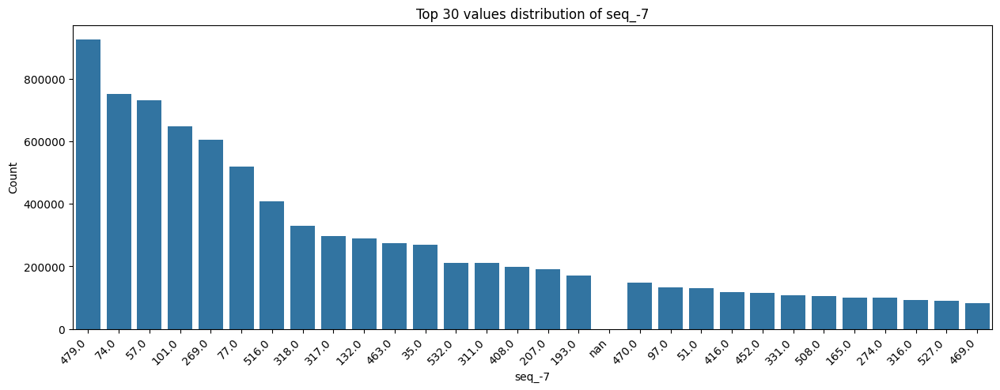

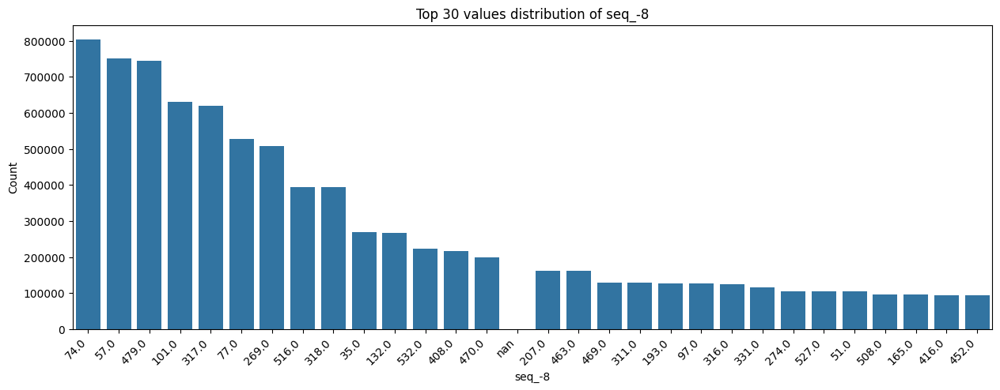

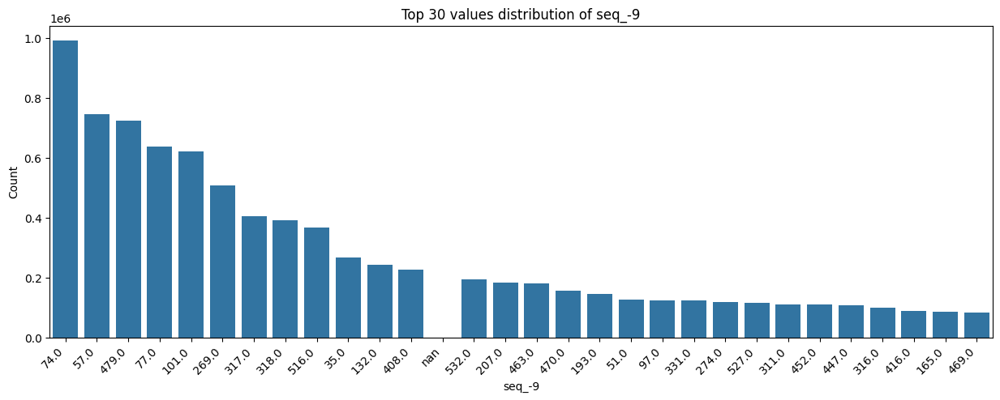

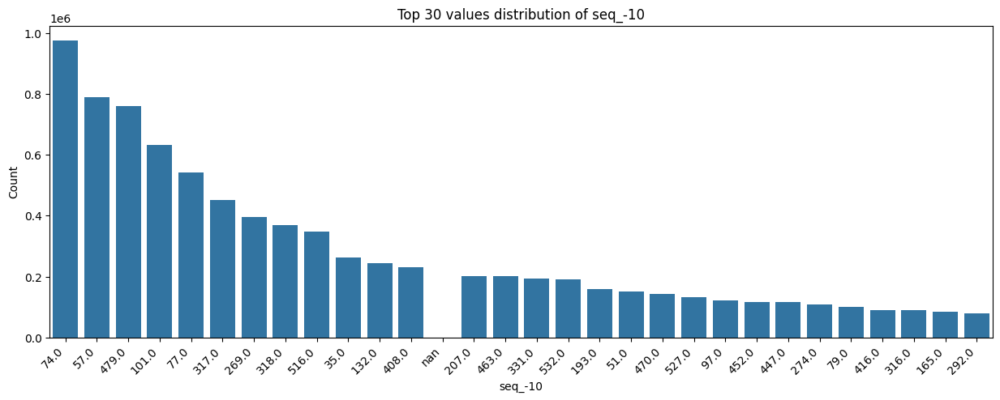

In [30]:
def value_distribution(df_pl, col, top_k = 20):
    counts = df_pl.group_by(col).len().sort("len", descending=True).with_columns([(pl.col("len") / pl.col("len").sum()).alias("ratio")]).to_pandas()
    return counts.head(top_k)

def plot_value_distribution(df_pl, col, top_k=20):
    dist = value_distribution(df_pl, col, top_k=top_k)
    
    plt.figure(figsize=(15, 5))
    sns.barplot(data=dist, x=col, y="len", order=dist[col].astype(str))
    plt.xticks(rotation=45, ha="right")
    plt.title(f"Top {top_k} values distribution of {col}")
    plt.ylabel("Count")
    plt.xlabel(col)
    plt.show()
    
    return dist

front_cols = [f"seq_{i}" for i in range(1, r+1)]
back_cols  = [f"seq_-{k}" for k in range(1, r+1)]
all_cols   = front_cols + back_cols

distributions = {}
for c in all_cols:
    dist = plot_value_distribution(seq_df, c, top_k=30)
    distributions[c] = dist

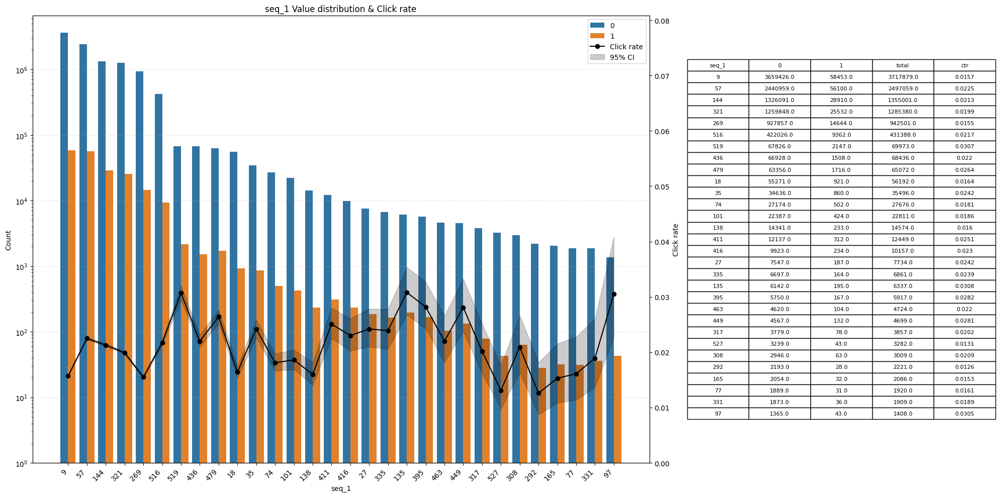

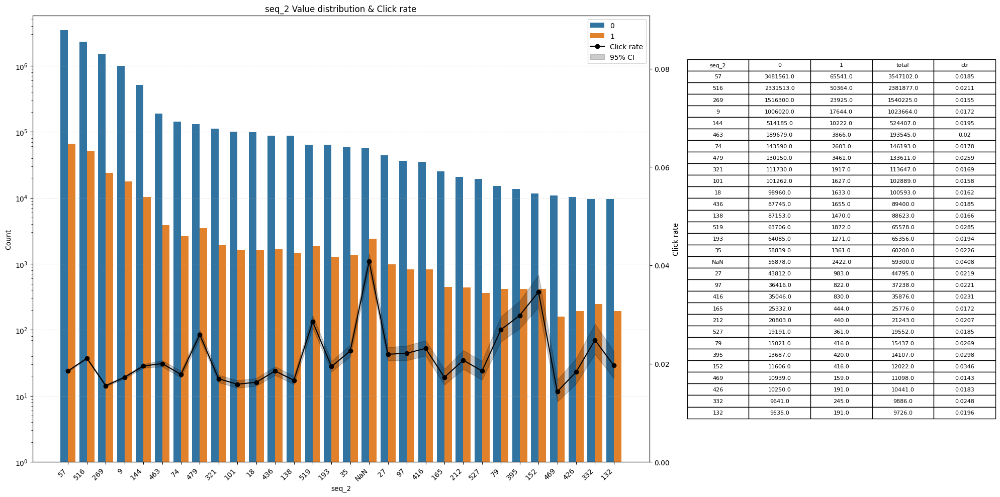

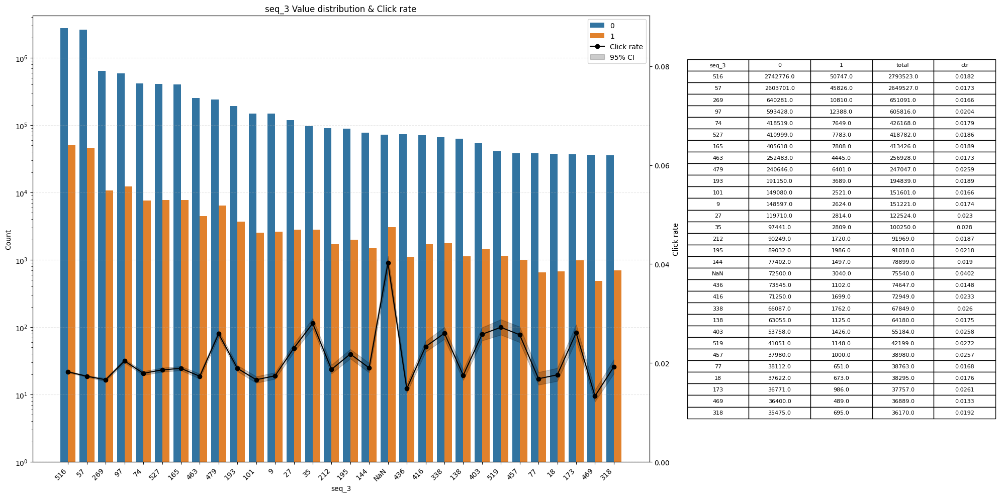

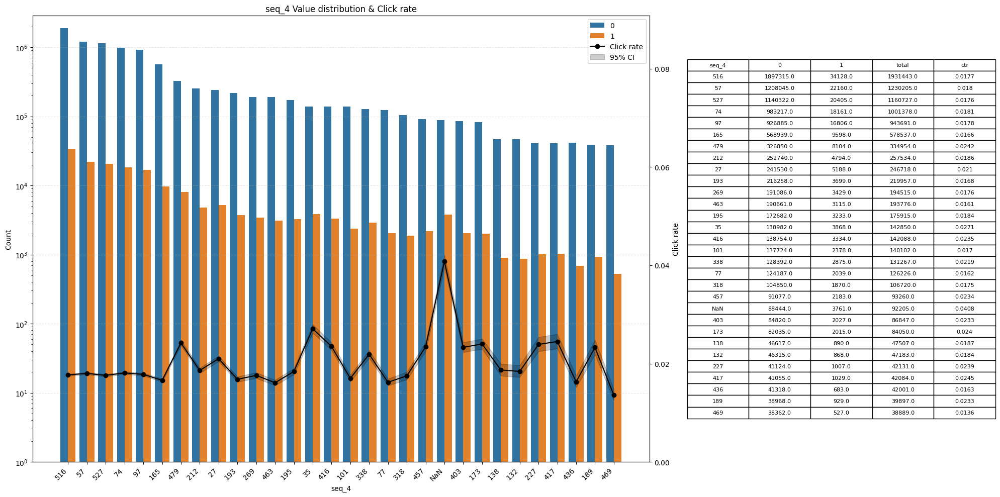

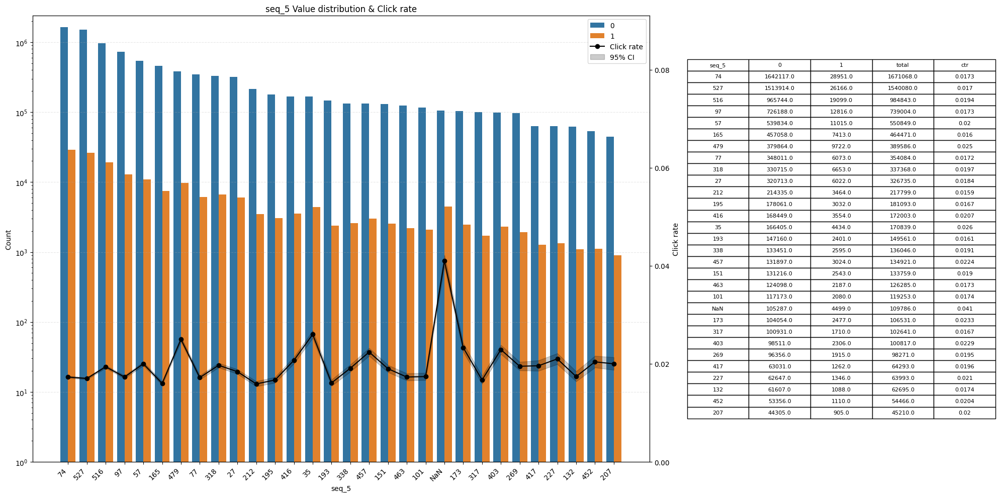

...

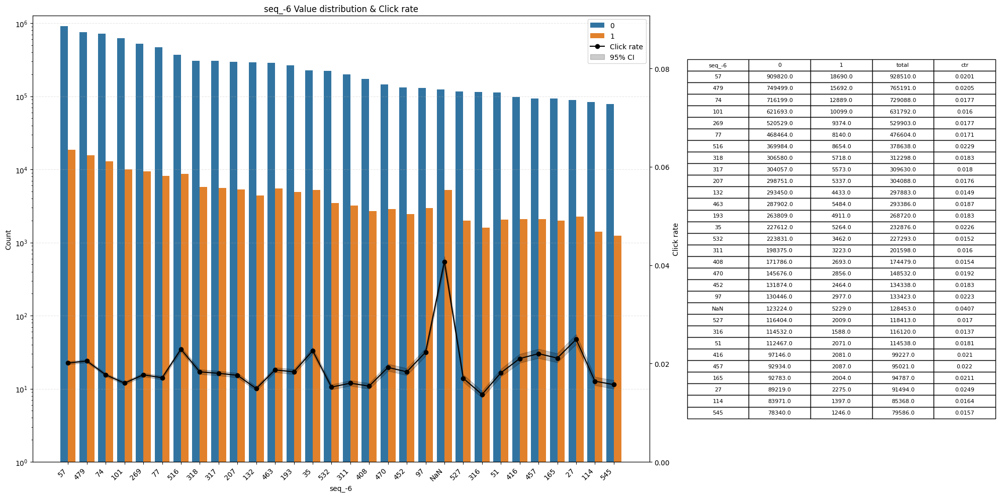

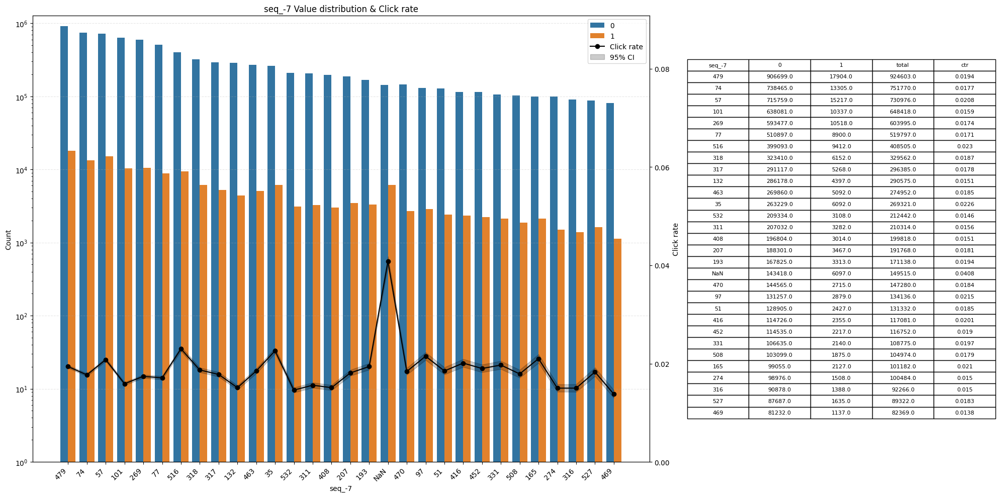

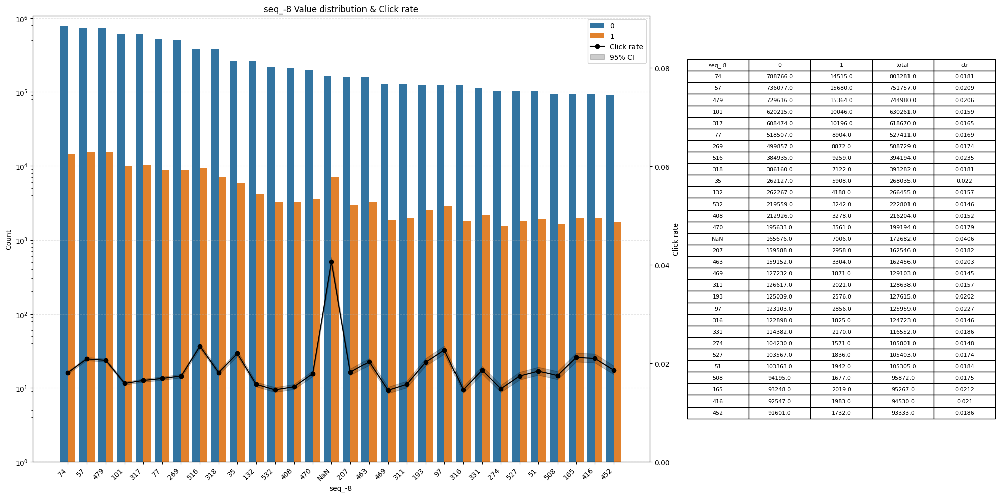

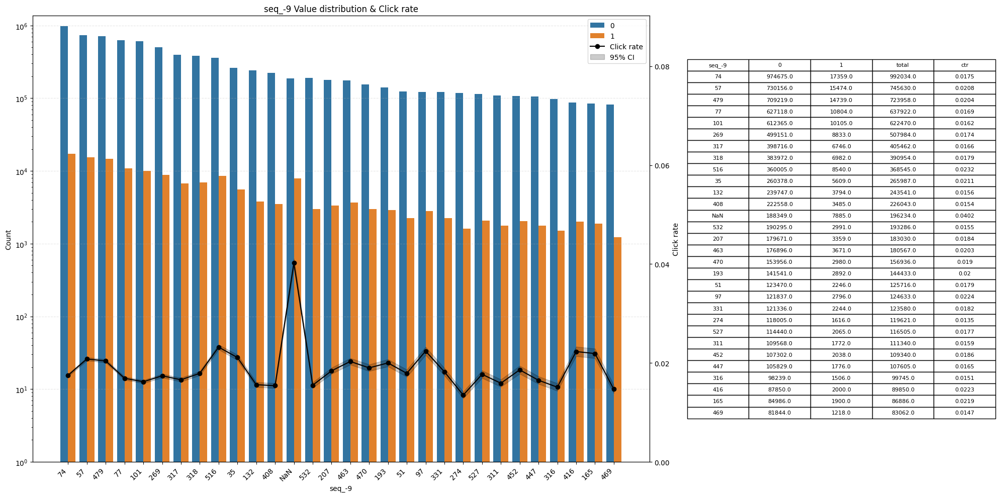

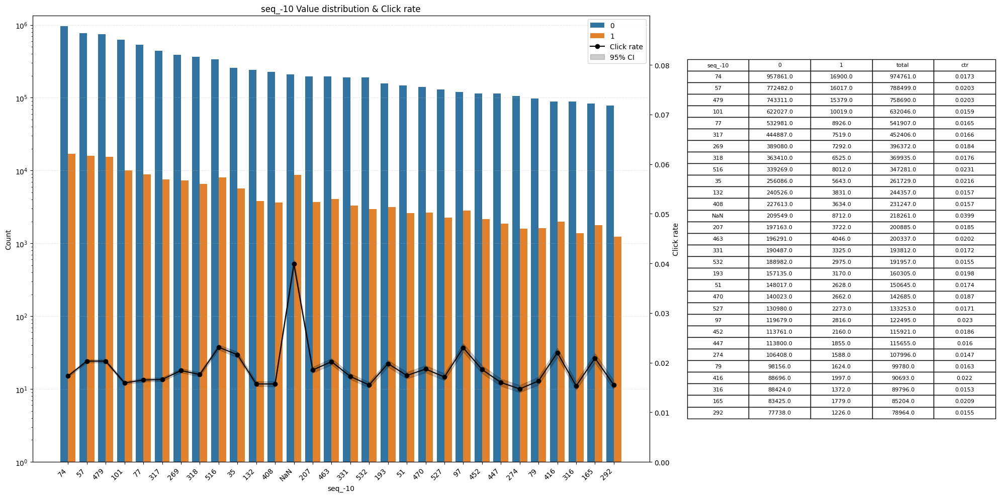

In [49]:
def summarize_ctr_by_value(df_pl, col):
    tmp = df_pl.select([pl.col(col), pl.col("clicked")]).with_columns(pl.col(col).cast(pl.Utf8).fill_null("NaN")).to_pandas()
    
    pv = tmp.groupby([col, "clicked"]).size().reset_index(name="count").pivot(index=col, columns="clicked", values="count").fillna(0)

    if 0 not in pv.columns: pv[0] = 0
    if 1 not in pv.columns: pv[1] = 0

    pv["total"] = pv[0] + pv[1]
    pv["ctr"] = ((pv[1] / pv["total"]).replace([np.inf, np.nan], 0.0)).round(4)

    try:
        pv = pv.sort_index(key=lambda x: x.astype(float))
    except Exception:
        pv = pv.sort_index()

    pv = pv.reset_index()
    return pv 

def eda_plot_by_clicked_topk(df_pl, col, title=None, top_k=20, log_scale=True):
    pv = summarize_ctr_by_value(df_pl, col)

    pv_top = pv.sort_values("total", ascending=False).head(top_k)
    order = pv_top[col].tolist()

    cnt = (df_pl.select([pl.col(col), pl.col("clicked")]).with_columns(pl.col(col).cast(pl.Utf8).fill_null("NaN")).to_pandas())
    cnt = cnt[cnt[col].isin(order)]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw={"width_ratios": [2, 1]})

    sns.countplot(data=cnt, x=col, hue="clicked", ax=ax1, order=order)
    ax1.set_xlabel(col)
    ax1.set_ylabel("Count")
    ax1.set_title(title or f"Distribution of {col} by Clicked" + (" (log-scaled)" if log_scale else ""))
    ax1.tick_params(axis="x", rotation=45)
    plt.setp(ax1.get_xticklabels(), ha="right")
    ax1.grid(axis="y", linestyle="--", alpha=0.3)
    
    if log_scale:
        ax1.set_yscale("log")
        ax1.set_ylim(1, None)

    ax1b = ax1.twinx()
    p = pv_top.set_index(col).loc[order, "ctr"].values
    n = pv_top.set_index(col).loc[order, "total"].values
    lower, upper = wilson_bounds(p, n)

    ax1b.plot(order, p, marker="o", linestyle="-", color="black", label="Click rate")
    ax1b.fill_between(order, lower, upper, color="black", alpha=0.2, label="95% CI")
    ax1b.set_ylabel("Click rate")
    ctr_min, ctr_max = pv_top["ctr"].min(), pv_top["ctr"].max()
    pad = 0.05 if ctr_max > ctr_min else 0.1
    ax1b.set_ylim(max(0, ctr_min - pad), min(1, ctr_max + pad))

    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax1b.get_legend_handles_labels()
    ax1.legend(handles1 + handles2, labels1 + labels2, loc="upper right")

    ax2.axis("off")
    table_data = pv_top.reset_index(drop=True)
    the_table = ax2.table(cellText=table_data.values.tolist(), colLabels=table_data.columns.tolist(), cellLoc="center", loc="center")
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(8)
    the_table.scale(1, 1.2)

    plt.tight_layout()
    plt.show()

    return pv

front_cols = [f"seq_{i}" for i in range(1, r+1)]
back_cols  = [f"seq_-{k}" for k in range(1, r+1)]
all_cols   = front_cols + back_cols

summary_tables = {}
for c in all_cols:
    pv = eda_plot_by_clicked_topk(seq_df, c, title=f"{c} Value distribution & Click rate", top_k=30, log_scale=True)
    summary_tables[c] = pv

## Other features
- l_feat_*
- feat_a_*
- feat_b_*
- feat_c_*
- feat_d_*
- feat_e_*
- history_a_*
- history_b_*

In [6]:
# 각 피처 그룹의 기본 통계 확인
feature_groups = {
    'l_feat': [col for col in train_rawdf.columns if col.startswith('l_feat_')],
    'feat_a': [col for col in train_rawdf.columns if col.startswith('feat_a_')],
    'feat_b': [col for col in train_rawdf.columns if col.startswith('feat_b_')],
    'feat_c': [col for col in train_rawdf.columns if col.startswith('feat_c_')],
    'feat_d': [col for col in train_rawdf.columns if col.startswith('feat_d_')],
    'feat_e': [col for col in train_rawdf.columns if col.startswith('feat_e_')],
    'history_a': [col for col in train_rawdf.columns if col.startswith('history_a_')],
    'history_b': [col for col in train_rawdf.columns if col.startswith('history_b_')]
}

# 각 그룹별 기본 통계   
for group_name, cols in feature_groups.items():
    if cols: 
        sample_stats = train_rawdf.select(cols).describe()
        print(f"       \n #### Group name {group_name} statistics ####")
        print(sample_stats)

       
 #### Group name l_feat statistics ####
shape: (9, 28)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ statistic ┆ l_feat_1  ┆ l_feat_2  ┆ l_feat_3  ┆ … ┆ l_feat_24 ┆ l_feat_25 ┆ l_feat_26 ┆ l_feat_2 │
│ ---       ┆ ---       ┆ ---       ┆ ---       ┆   ┆ ---       ┆ ---       ┆ ---       ┆ 7        │
│ str       ┆ f64       ┆ f64       ┆ f64       ┆   ┆ f64       ┆ f64       ┆ f64       ┆ ---      │
│           ┆           ┆           ┆           ┆   ┆           ┆           ┆           ┆ f64      │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪══════════╡
│ count     ┆ 1.0704179 ┆ 1.0686971 ┆ 1.0704179 ┆ … ┆ 1.0686971 ┆ 1.0704179 ┆ 1.0704179 ┆ 1.070417 │
│           ┆ e7        ┆ e7        ┆ e7        ┆   ┆ e7        ┆ e7        ┆ e7        ┆ 9e7      │
│ null_coun ┆ 0.0       ┆ 17208.0   ┆ 0.0       ┆ … ┆ 17208.0   ┆ 0.0       ┆ 0.0       ┆ 0.0      │
│ t         ┆           ┆   

In [ ]:
def analyze_feature_distribution(df, col):
    data = df[col].drop_nulls().to_numpy()

    # 0개면 바로 리턴
    if data.size == 0:
        return {'mean': np.nan, 'std': np.nan, 'min': np.nan, 'max': np.nan,
                'median': np.nan, 'skewness': 0.0, 'kurtosis': 0.0,
                'zero_count': 0, 'zero_ratio': 0.0, 'negative_count': 0,
                'null_count': df[col].null_count()}

    # 1~2개면 왜도/첨도는 0으로
    if data.size < 3:
        skew, kurt = 0.0, 0.0
    else:
        skew, kurt = stats.skew(data), stats.kurtosis(data)

    stats_dict = {
        'mean': np.mean(data),
        'std': np.std(data),
        'min': np.min(data),
        'max': np.max(data),
        'median': np.median(data),
        'skewness': skew,
        'kurtosis': kurt,
        'zero_count': np.sum(data == 0),
        'zero_ratio': np.sum(data == 0) / len(data),
        'negative_count': np.sum(data < 0),
        'null_count': df[col].null_count()
    }
    return stats_dict

# quantile edges
def _quantile_edges(df: pl.DataFrame, col: str, bins: int = 10):
    # 1) 유효값만 추출 (NaN/Inf 제거)
    mask = pl.col(col).is_not_null() & pl.col(col).is_finite()
    vals = df.filter(mask).get_column(col).to_numpy()

    # 2) 유효값이 없거나 2개 미만이면 binning 불가 → None
    if vals.size < 2:
        return None

    vmin, vmax = np.min(vals), np.max(vals)

    # 3) 전부 동일한 값(상수 컬럼)인 경우: 아주 작은 폭의 가짜 구간 생성
    if np.allclose(vmin, vmax):
        eps = 1e-12 if vmin == 0 else abs(vmin) * 1e-9
        return np.array([vmin - eps, vmin + eps], dtype=float)

    # 4) 분위수 경계 계산 (numpy 사용)
    qs = np.linspace(0.0, 1.0, bins + 1)
    edges = np.quantile(vals, qs)

    # 5) NaN 제거/중복 제거 및 단조 증가 보정
    edges = edges[np.isfinite(edges)]
    edges = np.unique(edges)
    if edges.size < 2:
        # 고유 경계가 2개 미만이면 균등 간격으로 대체
        edges = np.linspace(vmin, vmax, min(bins + 1, 3))

    # 단조성 보장(동일값이 남으면 아주 조금씩 밀어주기)
    for i in range(1, edges.size):
        if edges[i] <= edges[i - 1]:
            edges[i] = np.nextafter(edges[i - 1], np.inf)

    return edges


def winsorize_pl(df, col, p=0.005):
    ql, qh = df[col].quantile(p), df[col].quantile(1-p)
    return df.with_columns(pl.col(col).clip(ql, qh).alias(f"{col}_w"))


def add_asinh(df, col):
    return df.with_columns(pl.col(col).arcsinh().alias(f"{col}_asinh"))


def add_logit01(df, col, eps=1e-4):
    x = pl.col(col).clip(eps, 1-eps)
    return df.with_columns(((x/(1-x)).log()).alias(f"{col}_logit"))


def add_rank_gauss(df, col):
    nonnull = df.filter(pl.col(col).is_not_null())
    n = nonnull.height
    ranked = (nonnull
        .select([pl.col(col), pl.col(col).rank("average").alias("rk")])
        .with_columns(((pl.col("rk") - 0.5) / n).alias("u"))
        .with_columns(pl.col("u").map_elements(norm.ppf).alias(f"{col}_rg"))
        .select([col, f"{col}_rg"]))
    return df.join(ranked, on=col, how="left")


def add_rank_gauss_fast(series: pl.Series, out_name: str | None = None) -> pl.Series:
    name = out_name or f"{series.name}_rg"
    # rank: null은 null로 남음
    r = series.rank("average")
    # 유효 개수 (nonnull)
    n_valid = series.len() - series.null_count()
    if n_valid <= 1:
        # 데이터가 사실상 상수면 0으로 반환
        return pl.Series(name, np.zeros(series.len(), dtype=float))

    # U = (rank-0.5)/n (null은 남겨둠)
    # ndtri(U) = norm.ppf(U)
    # ndtri는 numpy-vectorized이므로 한 번에 처리 가능
    u = r.to_numpy()        # ndarray(float), null은 np.nan
    # 안전하게 [eps, 1-eps] 로 클리핑 (ppf 안정화)
    eps = 1e-12
    u = np.where(np.isfinite(u), np.clip((u - 0.5)/n_valid, eps, 1 - eps), np.nan)
    z = ndtri(u)            # vectorized
    return pl.Series(name, z)


def suggest_transformation(stats_dict):
    """
    분포 특성에 따라 적절한 변환 방법을 제안하는 함수
    """
    suggestions = []
    
    # 0이 많은 경우 (sparse feature)
    if stats_dict['zero_ratio'] > 0.5:
        suggestions.append("sparse_feature")
    
    # 음수가 있는 경우
    if stats_dict['negative_count'] > 0:
        suggestions.append("has_negative")
    
    # 치우친 분포 (skewness > 1 or < -1)
    if abs(stats_dict['skewness']) > 1:
        if stats_dict['skewness'] > 1:
            suggestions.append("right_skewed")
        else:
            suggestions.append("left_skewed")
    
    # 극값이 많은 경우 (kurtosis > 3)
    if stats_dict['kurtosis'] > 3:
        suggestions.append("heavy_tailed")
    
    return suggestions


def safe_series(colname, values, df_index, valid_idx):
    """
    원래 df 길이에 맞춰서 변환 결과를 채워 넣고,
    NaN 위치는 그대로 유지.
    """
    arr = np.full(len(df_index), np.nan, dtype=float)
    arr[valid_idx] = values
    return pl.Series(colname, arr)


def choose_fast_transform(vmin, vmax, skew, kurt, has_neg, q01=None, q99=None):
    # 확률형 판정(분포의 1~99% 범위가 [0,1] 안에 거의 들어오면)
    if q01 is not None and q99 is not None:
        if 0 <= q01 and q99 <= 1:
            return "logit"
    elif 0 <= vmin and vmax <= 1:
        return "logit"
    if has_neg:
        # 음수 포함이면 asinh가 가장 안전/저렴
        return "asinh"
    if vmin >= 0 and skew > 1:
        return "log1p"
    if abs(skew) > 1 or kurt > 0:
        return "rank_gauss_fast"  # 비정규 → 순위 정규화(가성비 최고)
    return "robust_scaler"


def apply_transformation(df, col, transformation_type, **kwargs):
    # NaN 제외하고 유효값만 뽑음
    valid_mask = df[col].is_not_null()
    valid_idx = np.where(valid_mask.to_numpy())[0]
    x = df[col].to_numpy()

    try:
        if transformation_type in ("yeo_johnson", "box_cox"):
            method = "yeo-johnson" if transformation_type=="yeo_johnson" else "box-cox"
            pt = PowerTransformer(method=method, standardize=False)

            sample = x[valid_idx]
            if len(sample) > 20000:
                sample = np.random.choice(sample, 20000, replace=False)

            pt.fit(sample.reshape(-1,1))
            xt = pt.transform(x[valid_idx].reshape(-1,1)).ravel()

            newcol = f"{col}_{'yj' if method=='yeo-johnson' else 'bc'}"
            return df.with_columns([safe_series(newcol, xt, df[col], valid_idx)])

        elif transformation_type == "quantile_transform":
            qt = QuantileTransformer(output_distribution="normal", random_state=42)
            xt = qt.fit_transform(x[valid_idx].reshape(-1,1)).ravel()
            newcol = f"{col}_quantile"
            return df.with_columns([safe_series(newcol, xt, df[col], valid_idx)])

        elif transformation_type == "rank_gauss":
            nonnull = df.filter(valid_mask)
            n = nonnull.height
            ranked = (nonnull
                .select([pl.col(col), pl.col(col).rank("average").alias("rk")])
                .with_columns(((pl.col("rk") - 0.5) / n).alias("u"))
                .with_columns(pl.col("u").map_elements(norm.ppf).alias(f"{col}_rg"))
                .select([col, f"{col}_rg"]))
            return df.join(ranked, on=col, how="left")

        elif transformation_type == "asinh":
            return df.with_columns(pl.col(col).arcsinh().alias(f"{col}_asinh"))

        elif transformation_type == "logit":
            eps = kwargs.get("eps", 1e-4)
            x_clip = pl.col(col).clip(eps, 1-eps)
            return df.with_columns(((x_clip/(1-x_clip)).log()).alias(f"{col}_logit"))

        elif transformation_type == "log1p":
            return df.with_columns(pl.col(col).log1p().alias(f"{col}_log1p"))

        elif transformation_type == "sqrt":
            return df.with_columns(pl.col(col).sqrt().alias(f"{col}_sqrt"))

        elif transformation_type == "square":
            return df.with_columns(pl.col(col).pow(2).alias(f"{col}_square"))

        elif transformation_type == "robust_scaler":
            med = df[col].median()
            q75, q25 = df[col].quantile(0.75), df[col].quantile(0.25)
            iqr = q75 - q25
            if not np.isfinite(iqr) or iqr == 0:
                return df.with_columns(pl.lit(0.0).alias(f"{col}_robust"))
            return df.with_columns(((pl.col(col)-med)/iqr).alias(f"{col}_robust"))

        else:
            return df

    except Exception as e:
        print(f"{col} 변환 실패({transformation_type}): {e}")
        return df


def transform_features_by_group(df, prefix, transformation_strategy="auto", winsorize_p=0.005, n_jobs=2):
    """
    특정 prefix를 가진 feature들을 병렬 변환하는 함수 (범주형 제외)
    """
    feat_cols = [c for c in df.columns if c.startswith(prefix)]
    summary = {}

    def process_col(col, series):
        try:
            # 범주형 체크
            if is_categorical_feature(df, col):
                return col, None, {"type":"categorical","transformation":"none"}

            # winsorize
            ql, qh = series.quantile(winsorize_p), series.quantile(1-winsorize_p)
            series_w = series.clip(ql, qh)

            # 분포 분석
            stats_dict = analyze_feature_distribution(df, col)
            skew, kurt = stats_dict["skewness"], stats_dict["kurtosis"]
            vmin, vmax = stats_dict["min"], stats_dict["max"]
            has_neg = stats_dict["negative_count"] > 0

            # 변환 선택
            if transformation_strategy=="auto":
                if 0 <= vmin and vmax <= 1:
                    transformation = "logit"
                elif has_neg:
                    transformation = "yeo_johnson" if abs(skew)>1 or kurt>0 else "asinh"
                elif vmin>0 and skew>1:
                    transformation = "box_cox"
                elif skew>1:
                    transformation = "log1p"
                elif skew<-1:
                    transformation = "yeo_johnson"
                elif kurt>0:
                    transformation = "yeo_johnson"
                else:
                    transformation = "rank_gauss"
            else:
                transformation = transformation_strategy

            # 변환 적용
            df_temp = pl.DataFrame({col+"_w": series_w})
            df_new = apply_transformation(df_temp, col+"_w", transformation)

            return col, df_new.select(df_new.columns[-1]), {
                "type":"continuous",
                "transformation":transformation,
                "original_stats":stats_dict
            }

        except Exception as e:
            return col, None, {"type":"continuous","transformation":"failed","error":str(e)}

    # 병렬 실행 (각 워커는 Series 단위만 처리)
    results = Parallel(n_jobs=n_jobs, verbose=5)(
        delayed(process_col)(col, df[col]) for col in feat_cols
    )

    # 결과 합치기
    transformed_df = df.clone()
    for col, series_df, info in results:
        summary[col] = info
        if series_df is not None:
            transformed_df = transformed_df.hstack(series_df)

    return transformed_df, summary


def transform_features_by_group_fast(
    df: pl.DataFrame,
    prefix: str,
    winsorize_p: float = 0.005,
    n_jobs: int = 1,
):
    feat_cols = [c for c in df.columns if c.startswith(prefix)]
    summary = {}

    def process_col_fast(col: str, s: pl.Series):
        try:
            # 범주형은 스킵
            if is_categorical_feature(df, col):
                return col, None, {"type": "categorical", "transformation": "none"}

            # winsorize (Polars 벡터화)
            ql, qh = s.quantile(winsorize_p), s.quantile(1 - winsorize_p)
            s_w = s.clip(ql, qh)
            vmin, vmax = s_w.min(), s_w.max()
            # 통계는 빠르게 numpy로
            x = s_w.drop_nulls().to_numpy()
            q01, q99 = (np.quantile(x, [0.01, 0.99]) if x.size else (vmin, vmax))
            skew = 0.0 if len(x) == 0 else stats.skew(x)
            kurt = 0.0 if len(x) == 0 else stats.kurtosis(x)
            has_neg = vmin < 0

            # 변환 선택(빠른 규칙)
            t = choose_fast_transform(vmin, vmax, skew, kurt, has_neg, q01=q01, q99=q99)

            # 변환 적용 (전부 벡터화)
            if t == "log1p":
                out = pl.Series(f"{col}_w_log1p", np.log1p(s_w.to_numpy()))
            elif t == "asinh":
                out = pl.Series(f"{col}_w_asinh", np.arcsinh(s_w.to_numpy()))
            elif t == "logit":
                arr = s_w.to_numpy()
                eps = 1e-4
                arr = np.where(np.isfinite(arr), np.clip(arr, eps, 1 - eps), np.nan)
                out = pl.Series(f"{col}_w_logit", np.log(arr/(1 - arr)))
            elif t == "robust_scaler":
                med = s_w.median()
                q75, q25 = s_w.quantile(0.75), s_w.quantile(0.25)
                iqr = q75 - q25
                if iqr == 0:
                    out = pl.Series(f"{col}_w_robust", np.zeros(len(s_w), dtype=float))
                else:
                    out = pl.Series(f"{col}_w_robust", (s_w.to_numpy() - med) / iqr)
            elif t == "rank_gauss_fast":
                out = add_rank_gauss_fast(s_w, f"{col}_w_rg")
                t = "rank_gauss" 
            else:
                # fallback
                out = add_rank_gauss_fast(s_w, f"{col}_w_rg")
                t = "rank_gauss"

            info = {
                "type": "continuous",
                "transformation": t,
                "vmin": float(vmin) if vmin is not None else None,
                "vmax": float(vmax) if vmax is not None else None,
                "skew": float(skew),
                "kurt": float(kurt),
            }
            return col, pl.DataFrame([out]), info

        except Exception as e:
            return col, None, {"type": "continuous", "transformation": "failed", "error": str(e)}

    # 병렬 실행 (각 워커는 해당 Series만 받음 → 메모리 안정)
    results = Parallel(n_jobs=n_jobs, verbose=5)(
        delayed(process_col_fast)(col, df[col]) for col in feat_cols
    )

    # 결과 합치기
    transformed_df = df.clone()
    for col, subdf, info in results:
        summary[col] = info
        if subdf is not None:
            transformed_df = transformed_df.hstack(subdf)

    return transformed_df, summary


def plot_feature_type_analysis(df, prefix):
    """
    feature 타입 분석 결과를 시각화하는 함수
    """
    feat_cols = [col for col in df.columns if col.startswith(prefix)]
    
    categorical_count = 0
    continuous_count = 0
    
    for col in feat_cols:
        if is_categorical_feature(df, col):
            categorical_count += 1
        else:
            continuous_count += 1
    
    # 파이 차트
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    # 타입별 개수
    labels = ['Categorical', 'Continuous']
    sizes = [categorical_count, continuous_count]
    colors = ['lightblue', 'lightgreen']
    
    ax1.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
    ax1.set_title(f'{prefix} Feature Types')
    
    # 범주형 변수들의 고유값 개수 분포
    categorical_unique_counts = []
    for col in feat_cols:
        if is_categorical_feature(df, col):
            unique_count = df[col].n_unique()
            categorical_unique_counts.append(unique_count)
    
    if categorical_unique_counts:
        ax2.hist(categorical_unique_counts, bins=20, alpha=0.7, color='lightblue')
        ax2.set_title('Unique Values Count (Categorical Features)')
        ax2.set_xlabel('Number of Unique Values')
        ax2.set_ylabel('Number of Features')
    
    plt.tight_layout()
    plt.show()
    
    print(f"{prefix} 그룹 분석 결과:")
    print(f"  - 총 feature 수: {len(feat_cols)}")
    print(f"  - 범주형: {categorical_count}개")
    print(f"  - 연속형: {continuous_count}개")
    print()



# quantile binning을 사용하는 plot 함수
def plot_feature_group_quantile(
    df: pl.DataFrame,
    prefix: str,
    rows: int = 5,
    cols: int = 4,
    figsize=(20, 20),
    bins: int = 10,
    min_count: int = 200,   # bin 샘플 수가 이보다 작으면 CTR 선에서 제외
):

    N = df.height
    min_count = max(1000, int(0.001 * N))

    feat_cols = [c for c in df.columns if c.startswith(prefix)]
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()

    click_rates = {}

    for i, col in enumerate(feat_cols):
        ax = axes[i]
        unique_vals = df[col].n_unique()

        # 범주형 (그대로)
        if is_categorical_feature(df, col):
            tmp = (df.with_columns(pl.col(col).fill_null("NaN").alias(f"{col}_filled"))
                     .group_by(f"{col}_filled")
                     .agg([
                         pl.len().alias("count"),
                         pl.col("clicked").sum().alias("clicked_sum"),
                         pl.col("clicked").mean().alias("click_rate")
                     ])
                     .sort(f"{col}_filled"))
            ctr = tmp.to_pandas()

            bars = ctr.set_index(f"{col}_filled")["count"].plot(
                kind='bar', ax=ax, color='skyblue', alpha=0.7
            )
            for j, (category, count) in enumerate(ctr[[f"{col}_filled","count"]].values):
                ax.text(j, count + ctr["count"].max()*0.01, str(int(count)),
                        ha='center', va='bottom', fontsize=8)

            ax2 = ax.twinx()
            p = ctr['click_rate'].values
            n = ctr['count'].values
            lo, hi = wilson_bounds(p, n)
            ax2.plot(range(len(p)), p, color='red', marker='o', linewidth=2, markersize=6)
            ax2.fill_between(range(len(p)), lo, hi, color='red', alpha=0.2)
            ax2.set_ylabel('Click Rate', color='red', fontsize=8)
            ax2.tick_params(axis='y', labelcolor='red')
            ax.set_title(f'{col}\n(categorical, {unique_vals} values)')
            ax.set_ylabel('Count', color='blue', fontsize=8)

        # 연속형: 분위수 binning
        else:
            # 히스토그램은 원값 분포
            data_nonnull = df.filter(pl.col(col).is_not_null())[col].to_numpy()
            ax.hist(data_nonnull, bins=30, color='lightgreen', alpha=0.7)

            # 분위수 경계 생성
            edges = _quantile_edges(df, col, bins=bins)
            if edges is None or len(edges) < 2:
                continue  # or skip plot for this col

            # cut으로 분위수 bin 라벨링
            binned = (df.filter(pl.col(col).is_not_null())
                        .with_columns([
                            pl.col(col).cut(breaks=edges, include_breaks=True)
                                       .alias(f"{col}_qbin")
                        ]))

            # 각 bin의 중심(중앙값)과 CTR
            grouped = (binned.group_by(f"{col}_qbin")
                             .agg([
                                 pl.col("clicked").count().alias("count"),
                                 pl.col("clicked").mean().alias("click_rate"),
                                 pl.col(col).median().alias("bin_center")
                             ])
                             .sort(f"{col}_qbin"))

            ctr = grouped.to_pandas()

            # 최소 샘플 미만 bin은 CTR 선에서 제외
            mask = ctr["count"].values >= min_count
            x = ctr["bin_center"].values
            p = ctr["click_rate"].values
            n = ctr["count"].values
            lo, hi = wilson_bounds(p, n)

            ax2 = ax.twinx()
            ax2.plot(x[mask], p[mask], color='red', marker='o', linewidth=2, markersize=4)
            ax2.fill_between(x[mask], lo[mask], hi[mask], color='red', alpha=0.2)
            ax2.set_ylabel('Click Rate', color='red', fontsize=8)
            ax2.tick_params(axis='y', labelcolor='red')
            ax.set_title(f'{col}\n(quantile-binned continuous)')
            ax.set_ylabel('Frequency', color='green', fontsize=8)

        # 통계치표시
        stats_box = (df.select([
            pl.col(col).mean().alias("mean"),
            pl.col(col).std().alias("std"),
            pl.col(col).null_count().alias("null_count"),
            pl.len().alias("total_count")
        ]).to_pandas().iloc[0])
        nan_pct = (stats_box['null_count'] / stats_box['total_count']) * 100
        ax.text(0.02, 0.02,
                f"Mean: {stats_box['mean']:.2f}\nStd: {stats_box['std']:.2f}\n"
                f"NaN: {int(stats_box['null_count'])}({nan_pct:.1f}%)",
                transform=ax.transAxes, va='bottom',
                bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8),
                fontsize=6)
        ax.tick_params(axis='x', rotation=45, labelsize=6)
        ax.tick_params(axis='y', labelsize=6)

    # 남는 서브플롯 제거
    for i in range(len(feat_cols), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

    # unique count, null count 표시
    print(f"\n'{prefix}' feature statistics:") 
    for col in feat_cols: 
        unique_count = df[col].n_unique() 
        null_count = df[col].null_count() 
        print(f"{col:15s}: {unique_count:3d} unique, {null_count:,} nulls")


def create_transformed_features_df(df, prefix, transformation_strategy='auto', winsorize_p=0.005):
    """
    변환된 feature들만으로 새로운 DataFrame을 생성하는 함수
    """
    # 원본 DataFrame에서 해당 prefix 컬럼들만 추출
    original_cols = [col for col in df.columns if col.startswith(prefix)]
    
    temp_df = df.select(['clicked'] + original_cols)
    
    # 변환 적용 (여기서 winsorize_p 넘겨줌)
    transformed_df, summary = transform_features_by_group(
        temp_df, prefix, transformation_strategy, winsorize_p=winsorize_p
    )
    
    # 변환된 컬럼들 확인
    print(f"변환된 DataFrame의 모든 컬럼들: {transformed_df.columns}")
    
    # 변환된 컬럼들만 추출
    transformed_cols = []
    for col in original_cols:
        if col in summary and summary[col]['transformation'] not in ['failed', 'none']:
            transformation = summary[col]['transformation']
            
            # suffix 매핑
            suffix_map = {
                "robust_scaler": "robust",
                "square": "square",
                "log1p": "log1p",
                "sqrt": "sqrt",
                "box_cox": "bc",
                "yeo_johnson": "yj",
                "quantile_transform": "quantile",
                "asinh": "asinh",
                "logit": "logit",
                "rank_gauss": "rg",
                "rank_gauss_fast": "rg"
            }
            suffix = suffix_map.get(transformation, transformation)
            transformed_col = f"{col}_w_{suffix}" if f"{col}_w_{suffix}" in transformed_df.columns else f"{col}_{suffix}"
            
            if transformed_col in transformed_df.columns:
                transformed_cols.append(transformed_col)
            else:
                print(f"Not found transformed: {transformed_col}")
    
    if transformed_cols:
        # 변환된 컬럼들만으로 새로운 DataFrame 생성
        result_df = transformed_df.select(['clicked'] + transformed_cols)
        print(f"변환된 {prefix} DataFrame 크기: {result_df.shape}")
        return result_df, summary
    else:
        print(f"변환된 컬럼이 없습니다.")
        return None, summary


# 심하게 튀면 winsorize_p = 0.001 로 조절
def create_transformed_features_df_fast(df, prefix, transformation_strategy='auto', winsorize_p=0.005):
    """
    변환된 feature들만으로 새로운 DataFrame을 생성하는 함수
    """
    # 원본 DataFrame에서 해당 prefix 컬럼들만 추출
    original_cols = [col for col in df.columns if col.startswith(prefix)]
    
    temp_df = df.select(['clicked'] + original_cols)
    
    # 변환 적용 (여기서 winsorize_p 넘겨줌)
    transformed_df, summary = transform_features_by_group_fast(
        temp_df, prefix, winsorize_p=winsorize_p
    )
    
    # 변환된 컬럼들 확인
    print(f"변환된 DataFrame의 모든 컬럼들: {transformed_df.columns}")
    
    # 변환된 컬럼들만 추출
    transformed_cols = []
    for col in original_cols:
        if col in summary and summary[col]['transformation'] not in ['failed', 'none']:
            transformation = summary[col]['transformation']
            
            # suffix 매핑
            suffix_map = {
                "robust_scaler": "robust",
                "square": "square",
                "log1p": "log1p",
                "sqrt": "sqrt",
                "box_cox": "bc",
                "yeo_johnson": "yj",
                "quantile_transform": "quantile",
                "asinh": "asinh",
                "logit": "logit",
                "rank_gauss": "rg"
            }
            suffix = suffix_map.get(transformation, transformation)
            transformed_col = f"{col}_w_{suffix}" if f"{col}_w_{suffix}" in transformed_df.columns else f"{col}_{suffix}"
            
            if transformed_col in transformed_df.columns:
                transformed_cols.append(transformed_col)
            else:
                print(f"Not found transformed: {transformed_col}")
    
    if transformed_cols:
        # 변환된 컬럼들만으로 새로운 DataFrame 생성
        result_df = transformed_df.select(['clicked'] + transformed_cols)
        print(f"변환된 {prefix} DataFrame 크기: {result_df.shape}")
        return result_df, summary
    else:
        print(f"변환된 컬럼이 없습니다.")
        return None, summary

#### l_feat_*
- 속성 정보 피쳐
- l_feat_14는 Ads set

In [70]:
l_feat_cols = [col for col in train_rawdf.columns if col.startswith('l_feat_')]
train_rawdf[l_feat_cols].head(10)

l_feat_1,l_feat_2,l_feat_3,l_feat_4,l_feat_5,l_feat_6,l_feat_7,l_feat_8,l_feat_9,l_feat_10,l_feat_11,l_feat_12,l_feat_13,l_feat_14,l_feat_15,l_feat_16,l_feat_17,l_feat_18,l_feat_19,l_feat_20,l_feat_21,l_feat_22,l_feat_23,l_feat_24,l_feat_25,l_feat_26,l_feat_27
f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
1.0,2.0,1.0,23.0,1.0,1.0,193.0,2.0,50.0,118.0,743.0,2877.0,2.0,1591.0,1058.0,2.0,50.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,5.0,2.0
2.0,2.0,3.0,17.0,193.0,116.0,164.0,2.0,14.0,109.0,674.0,218.0,2.0,122.0,751.0,1.0,14.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,16.0,1.0
1.0,2.0,1.0,7.0,675.0,85.0,227.0,2.0,362.0,212.0,1029.0,3916.0,1.0,2924.0,2304.0,2.0,362.0,3.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,16.0,1.0
2.0,2.0,2.0,7.0,294.0,442.0,130.0,2.0,163.0,179.0,102.0,789.0,2.0,2169.0,439.0,1.0,163.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,4.0,1.0
2.0,2.0,3.0,24.0,497.0,435.0,171.0,2.0,193.0,131.0,690.0,110.0,1.0,2084.0,106.0,1.0,193.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,15.0,4.0
2.0,2.0,3.0,17.0,404.0,502.0,170.0,2.0,66.0,122.0,6.0,3031.0,1.0,1073.0,426.0,1.0,66.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,1129.0,10.0,2.0
2.0,1.0,2.0,8.0,918.0,232.0,169.0,2.0,263.0,49.0,1286.0,4257.0,2.0,1550.0,435.0,1.0,263.0,5.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,11.0,4.0
1.0,2.0,1.0,6.0,935.0,816.0,282.0,2.0,293.0,166.0,1322.0,4659.0,2.0,3090.0,2484.0,2.0,293.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,15.0,1.0
2.0,2.0,3.0,14.0,870.0,769.0,134.0,2.0,395.0,236.0,1291.0,4517.0,2.0,3042.0,2411.0,1.0,395.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,15.0,2.0


In [86]:
train_rawdf.select(l_feat_cols).describe()

statistic,l_feat_1,l_feat_2,l_feat_3,l_feat_4,l_feat_5,l_feat_6,l_feat_7,l_feat_8,l_feat_9,l_feat_10,l_feat_11,l_feat_12,l_feat_13,l_feat_14,l_feat_15,l_feat_16,l_feat_17,l_feat_18,l_feat_19,l_feat_20,l_feat_21,l_feat_22,l_feat_23,l_feat_24,l_feat_25,l_feat_26,l_feat_27
str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""count""",1.0704179e7,1.0686971e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0686971e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0704179e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0704179e7,1.0704179e7,1.0704179e7
"""null_count""",0.0,17208.0,0.0,0.0,0.0,0.0,0.0,17208.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17208.0,17208.0,17208.0,17208.0,17208.0,17208.0,17208.0,0.0,0.0,0.0
"""mean""",1.858145,1.831941,2.357217,9.543342,393.810608,314.788177,147.909637,1.994026,212.802612,123.944603,623.435486,2348.137939,1.639047,1906.626099,1298.295166,1.141855,212.802612,2.316111,1.831902,2.0,1.962543,1.97845,1.0,1.000934,1132.434326,9.278297,1.758006
"""std""",0.348901,0.373918,0.716465,5.946347,289.993042,231.329376,71.926926,0.077063,125.103279,62.09058,392.16626,1541.107178,0.480277,978.614441,787.268372,0.348901,125.103279,1.372284,0.373953,0.0,0.189878,0.145208,0.0,0.030552,93.267479,5.48774,1.170101
"""min""",1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
"""25%""",2.0,2.0,2.0,7.0,105.0,109.0,94.0,2.0,101.0,83.0,288.0,878.0,1.0,1055.0,613.0,1.0,101.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,3.0,1.0
"""50%""",2.0,2.0,2.0,7.0,376.0,278.0,146.0,2.0,224.0,125.0,595.0,2247.0,2.0,2114.0,1190.0,1.0,224.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,11.0,1.0
"""75%""",2.0,2.0,3.0,12.0,652.0,471.0,212.0,2.0,309.0,179.0,949.0,3916.0,2.0,2924.0,2304.0,1.0,309.0,3.0,2.0,2.0,2.0,2.0,1.0,1.0,1129.0,15.0,2.0
"""max""",2.0,2.0,3.0,26.0,1079.0,903.0,313.0,2.0,476.0,262.0,1527.0,5061.0,2.0,3245.0,2590.0,2.0,476.0,6.0,2.0,2.0,2.0,2.0,1.0,2.0,2163.0,18.0,5.0


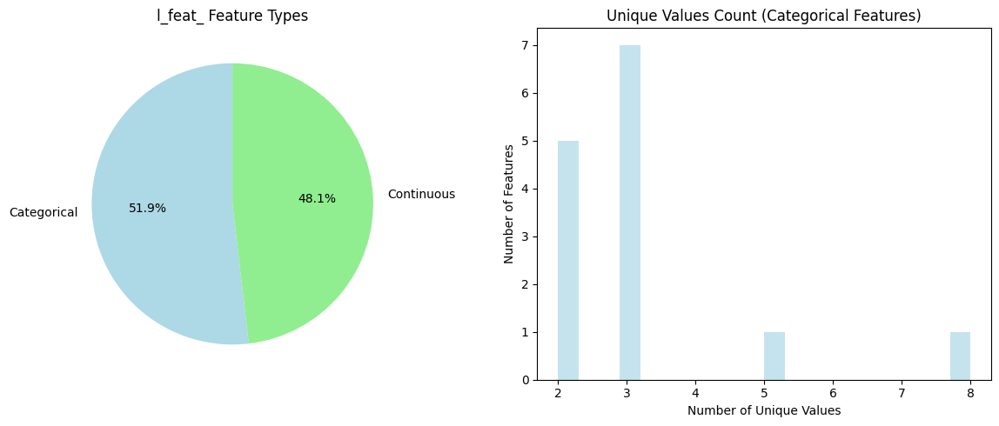

l_feat_ 그룹 분석 결과:
  - 총 feature 수: 27
  - 범주형: 14개
  - 연속형: 13개



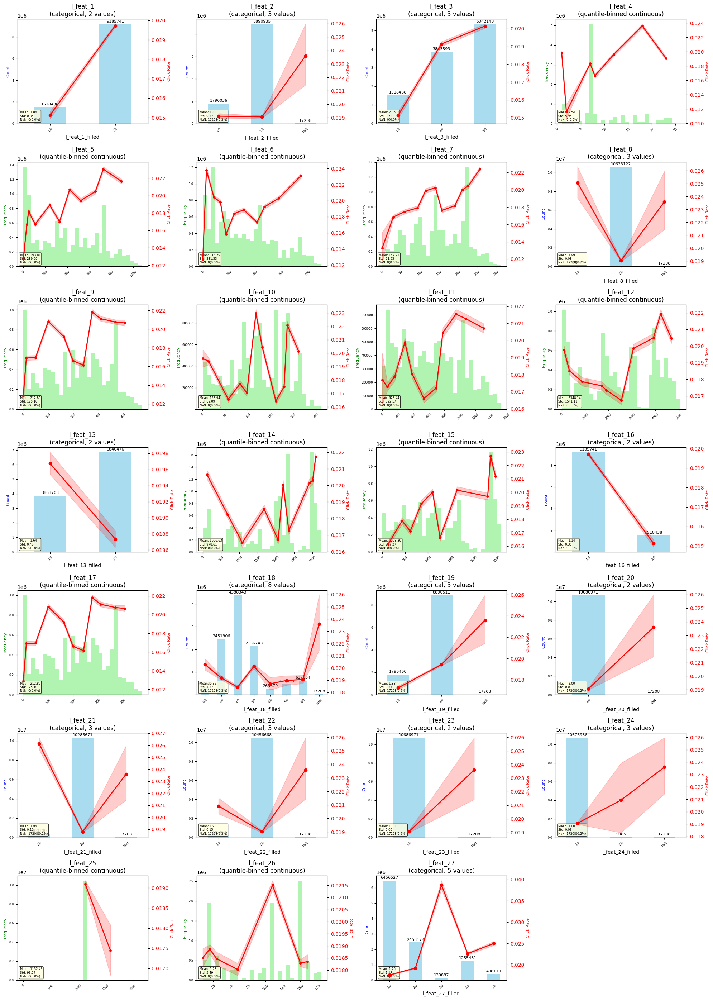


'l_feat_' feature statistics:
l_feat_1       :   2 unique, 0 nulls
l_feat_2       :   3 unique, 17,208 nulls
l_feat_3       :   3 unique, 0 nulls
l_feat_4       :  26 unique, 0 nulls
l_feat_5       : 1076 unique, 0 nulls
l_feat_6       : 900 unique, 0 nulls
l_feat_7       : 313 unique, 0 nulls
l_feat_8       :   3 unique, 17,208 nulls
l_feat_9       : 476 unique, 0 nulls
l_feat_10      : 262 unique, 0 nulls
l_feat_11      : 1524 unique, 0 nulls
l_feat_12      : 5050 unique, 0 nulls
l_feat_13      :   2 unique, 0 nulls
l_feat_14      : 3237 unique, 0 nulls
l_feat_15      : 2582 unique, 0 nulls
l_feat_16      :   2 unique, 0 nulls
l_feat_17      : 476 unique, 0 nulls
l_feat_18      :   8 unique, 17,208 nulls
l_feat_19      :   3 unique, 17,208 nulls
l_feat_20      :   2 unique, 17,208 nulls
l_feat_21      :   3 unique, 17,208 nulls
l_feat_22      :   3 unique, 17,208 nulls
l_feat_23      :   2 unique, 17,208 nulls
l_feat_24      :   3 unique, 17,208 nulls
l_feat_25      : 1788 unique, 0

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    7.0s


변환된 DataFrame의 모든 컬럼들: ['clicked', 'l_feat_1', 'l_feat_2', 'l_feat_3', 'l_feat_4', 'l_feat_5', 'l_feat_6', 'l_feat_7', 'l_feat_8', 'l_feat_9', 'l_feat_10', 'l_feat_11', 'l_feat_12', 'l_feat_13', 'l_feat_14', 'l_feat_15', 'l_feat_16', 'l_feat_17', 'l_feat_18', 'l_feat_19', 'l_feat_20', 'l_feat_21', 'l_feat_22', 'l_feat_23', 'l_feat_24', 'l_feat_25', 'l_feat_26', 'l_feat_27', 'l_feat_4_w_rg', 'l_feat_5_w_robust', 'l_feat_6_w_robust', 'l_feat_7_w_robust', 'l_feat_9_w_robust', 'l_feat_10_w_robust', 'l_feat_11_w_robust', 'l_feat_12_w_robust', 'l_feat_14_w_robust', 'l_feat_15_w_robust', 'l_feat_17_w_robust', 'l_feat_25_w_log1p', 'l_feat_26_w_robust']
변환된 l_feat_ DataFrame 크기: (10704179, 14)


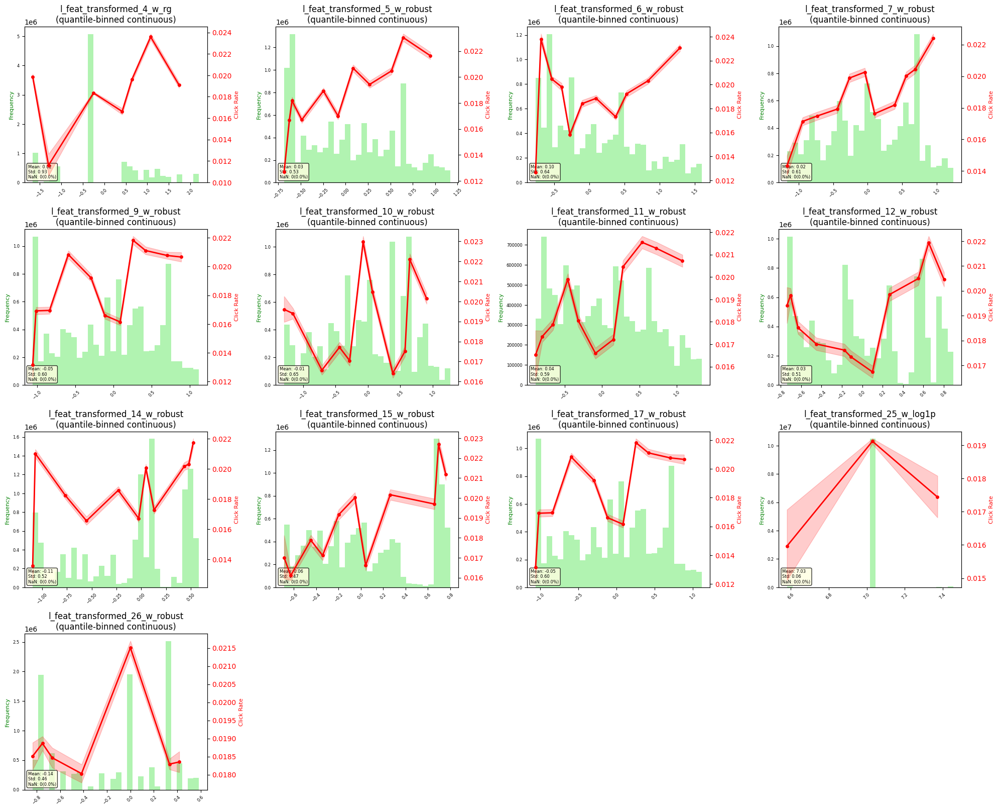


'l_feat_transformed_' feature statistics:
l_feat_transformed_4_w_rg:  24 unique, 0 nulls
l_feat_transformed_5_w_robust: 1013 unique, 0 nulls
l_feat_transformed_6_w_robust: 855 unique, 0 nulls
l_feat_transformed_7_w_robust: 285 unique, 0 nulls
l_feat_transformed_9_w_robust: 453 unique, 0 nulls
l_feat_transformed_10_w_robust: 247 unique, 0 nulls
l_feat_transformed_11_w_robust: 1467 unique, 0 nulls
l_feat_transformed_12_w_robust: 4944 unique, 0 nulls
l_feat_transformed_14_w_robust: 3121 unique, 0 nulls
l_feat_transformed_15_w_robust: 2504 unique, 0 nulls
l_feat_transformed_17_w_robust: 453 unique, 0 nulls
l_feat_transformed_25_w_log1p: 891 unique, 0 nulls
l_feat_transformed_26_w_robust:  18 unique, 0 nulls


In [71]:
# l_feat_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'l_feat_')

# l_feat_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'l_feat_', rows=7, cols=4, figsize=(20, 28), bins=10)

# l_feat_ 연속형 분포 변형
# l_feat_transformed_df, summary = create_transformed_features_df(train_rawdf, 'l_feat_', 'auto')
l_feat_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'l_feat_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('l_feat_', 'l_feat_transformed_') for col in l_feat_transformed_df.columns if col != 'clicked'}
l_feat_transformed_df = l_feat_transformed_df.rename(rename_dict)
plot_feature_group_quantile(l_feat_transformed_df, 'l_feat_transformed_', rows=7, cols=4, figsize=(20, 28), bins=10)

#### feat_a_*
- 정보영역피쳐 a

In [72]:
feat_a_cols = [col for col in train_rawdf.columns if col.startswith('feat_a')]
train_rawdf[feat_a_cols].head(10)

feat_a_1,feat_a_2,feat_a_3,feat_a_4,feat_a_5,feat_a_6,feat_a_7,feat_a_8,feat_a_9,feat_a_10,feat_a_11,feat_a_12,feat_a_13,feat_a_14,feat_a_15,feat_a_16,feat_a_17,feat_a_18
f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.4727,0.0,0.0,0.0,0.0
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.7767,0.0,0.0,0.0,0.0
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.6597,0.0,0.0,0.0,0.0
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.6936,0.0,0.0,0.0,0.0
0.0,0.0,30.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.3821,0.0,0.0,0.0,0.0
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.8758,0.0,0.0,0.0,0.0
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.1374,0.0,0.0,0.0,0.0
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.345,0.0,0.0,0.0,0.0
0.0,0.0,30.6,88.199997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.9422,0.0,0.0,0.0,0.0


In [ ]:
train_rawdf.select(feat_a_cols).describe()

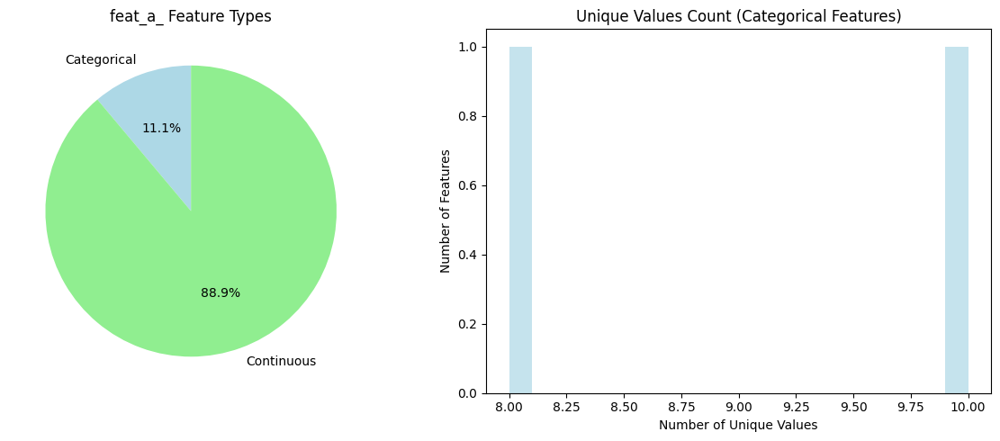

feat_a_ 그룹 분석 결과:
  - 총 feature 수: 18
  - 범주형: 2개
  - 연속형: 16개



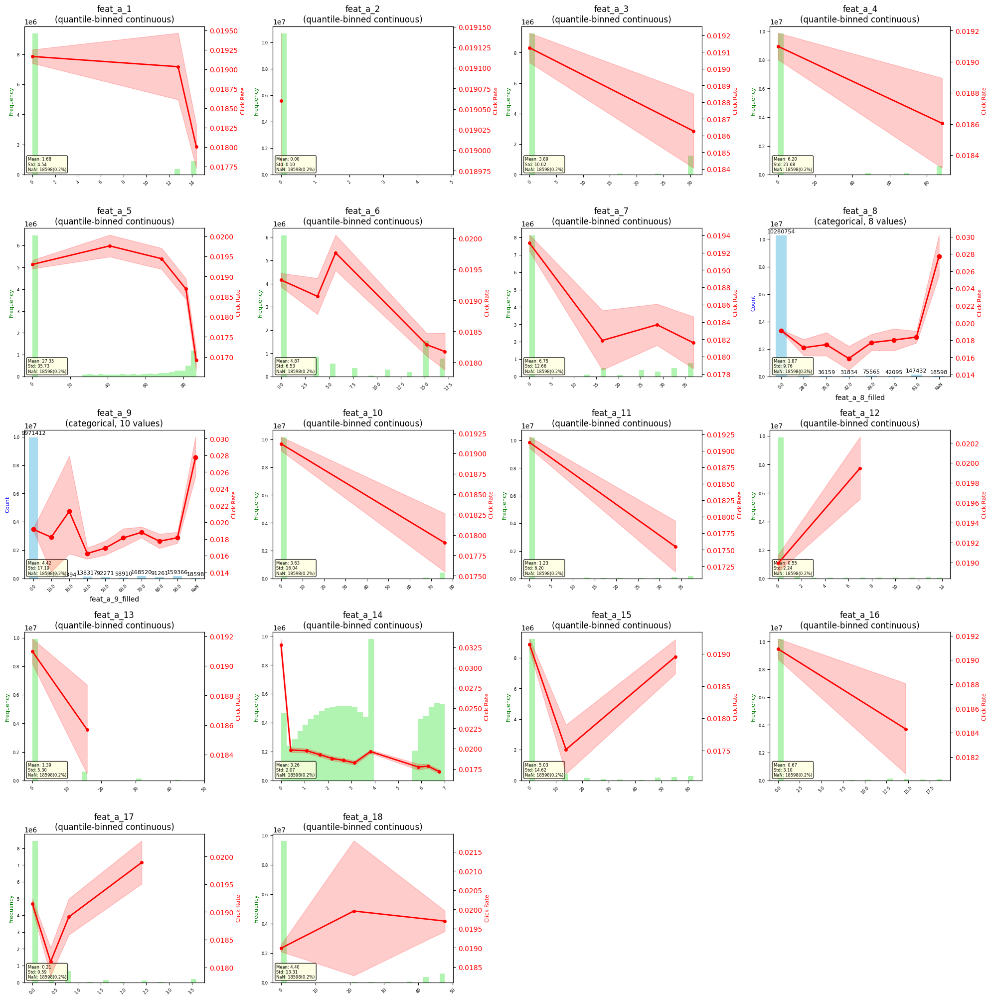


'feat_a_' feature statistics:
feat_a_1       :   6 unique, 18,598 nulls
feat_a_2       :   6 unique, 18,598 nulls
feat_a_3       :   7 unique, 18,598 nulls
feat_a_4       :   7 unique, 18,598 nulls
feat_a_5       : 492 unique, 18,598 nulls
feat_a_6       :  11 unique, 18,598 nulls
feat_a_7       :  10 unique, 18,598 nulls
feat_a_8       :   8 unique, 18,598 nulls
feat_a_9       :  10 unique, 18,598 nulls
feat_a_10      :   9 unique, 18,598 nulls
feat_a_11      :  10 unique, 18,598 nulls
feat_a_12      :  12 unique, 18,598 nulls
feat_a_13      :   6 unique, 18,598 nulls
feat_a_14      : 7218 unique, 18,598 nulls
feat_a_15      :  10 unique, 18,598 nulls
feat_a_16      :   8 unique, 18,598 nulls
feat_a_17      :  10 unique, 18,598 nulls
feat_a_18      :   8 unique, 18,598 nulls


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    9.2s


변환된 DataFrame의 모든 컬럼들: ['clicked', 'feat_a_1', 'feat_a_2', 'feat_a_3', 'feat_a_4', 'feat_a_5', 'feat_a_6', 'feat_a_7', 'feat_a_8', 'feat_a_9', 'feat_a_10', 'feat_a_11', 'feat_a_12', 'feat_a_13', 'feat_a_14', 'feat_a_15', 'feat_a_16', 'feat_a_17', 'feat_a_18', 'feat_a_1_w_log1p', 'feat_a_2_w_logit', 'feat_a_3_w_log1p', 'feat_a_4_w_log1p', 'feat_a_5_w_robust', 'feat_a_6_w_robust', 'feat_a_7_w_log1p', 'feat_a_10_w_log1p', 'feat_a_11_w_log1p', 'feat_a_12_w_log1p', 'feat_a_13_w_log1p', 'feat_a_14_w_robust', 'feat_a_15_w_log1p', 'feat_a_16_w_log1p', 'feat_a_17_w_log1p', 'feat_a_18_w_log1p']
변환된 feat_a_ DataFrame 크기: (10704179, 17)


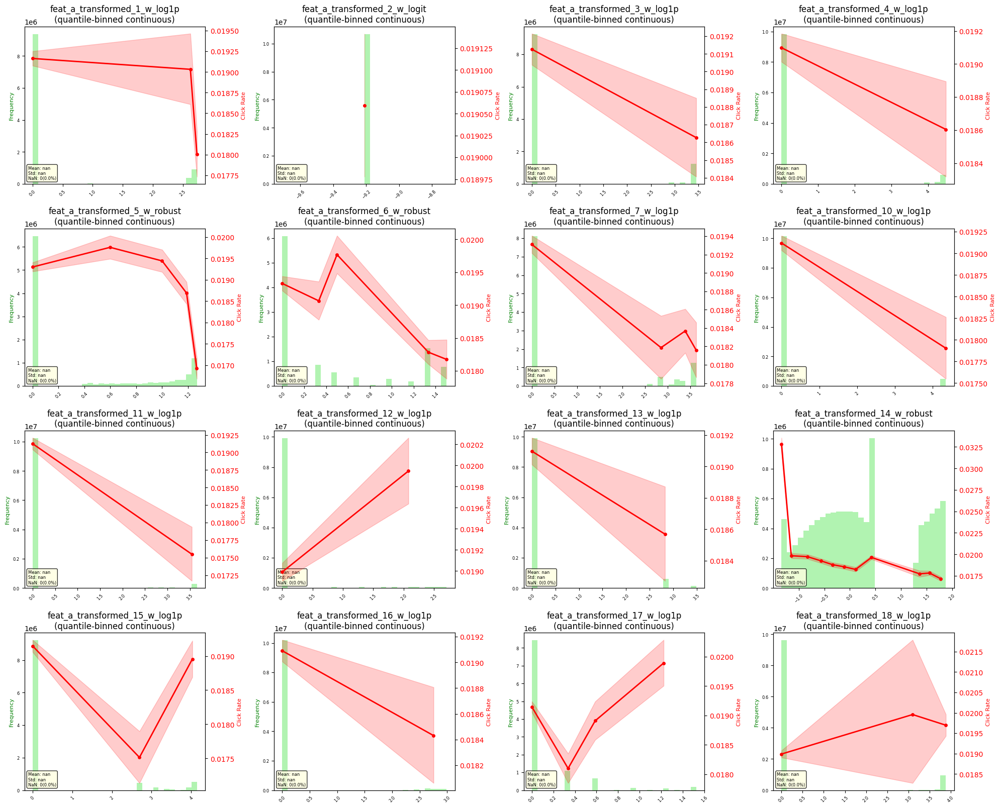


'feat_a_transformed_' feature statistics:
feat_a_transformed_1_w_log1p:   6 unique, 0 nulls
feat_a_transformed_2_w_logit:   2 unique, 0 nulls
feat_a_transformed_3_w_log1p:   7 unique, 0 nulls
feat_a_transformed_4_w_log1p:   7 unique, 0 nulls
feat_a_transformed_5_w_robust: 492 unique, 0 nulls
feat_a_transformed_6_w_robust:  11 unique, 0 nulls
feat_a_transformed_7_w_log1p:  10 unique, 0 nulls
feat_a_transformed_10_w_log1p:   9 unique, 0 nulls
feat_a_transformed_11_w_log1p:  10 unique, 0 nulls
feat_a_transformed_12_w_log1p:  12 unique, 0 nulls
feat_a_transformed_13_w_log1p:   4 unique, 0 nulls
feat_a_transformed_14_w_robust: 7183 unique, 0 nulls
feat_a_transformed_15_w_log1p:  10 unique, 0 nulls
feat_a_transformed_16_w_log1p:   8 unique, 0 nulls
feat_a_transformed_17_w_log1p:  10 unique, 0 nulls
feat_a_transformed_18_w_log1p:   8 unique, 0 nulls


In [73]:
# feat_a_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'feat_a_')

# feat_a_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'feat_a_', rows=7, cols=4, figsize=(20, 28), bins=10)

# feat_a_ 연속형 분포 변형
# feat_a_transformed_df, summary = create_transformed_features_df(train_rawdf, 'feat_a_', 'auto')
feat_a_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'feat_a_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('feat_a_', 'feat_a_transformed_') for col in feat_a_transformed_df.columns if col != 'clicked'}
feat_a_transformed_df = feat_a_transformed_df.rename(rename_dict)
plot_feature_group_quantile(feat_a_transformed_df, 'feat_a_transformed_', rows=7, cols=4, figsize=(20, 28), bins=10)

#### feat_b_*
- 정보영역피쳐 b

In [74]:
feat_b_cols = [col for col in train_rawdf.columns if col.startswith('feat_b')]
train_rawdf[feat_b_cols].head(10)

feat_b_1,feat_b_2,feat_b_3,feat_b_4,feat_b_5,feat_b_6
f32,f32,f32,f32,f32,f32
4.845361,-4.337349,47.611111,0.907216,-75.421051,1961.083374
4.43299,-4.46988,14.648149,0.927835,-34.771931,1195.75
4.402062,-0.819277,24.388889,0.917526,-67.701752,2386.083252
4.309278,-4.337349,27.962963,0.927835,-70.280701,2529.666748
4.350515,-3.939759,23.981482,0.927835,-56.666668,1797.416626
4.556701,-3.963856,16.75926,0.886598,-40.280701,431.25
0.247423,-0.120482,1.296296,0.061856,-15.105263,437.25
2.690722,-0.927711,6.333333,0.618557,-20.824562,1058.833374
4.845361,-3.903615,30.814816,0.927835,-55.245613,1239.916626


In [ ]:
train_rawdf.select(feat_b_cols).describe()

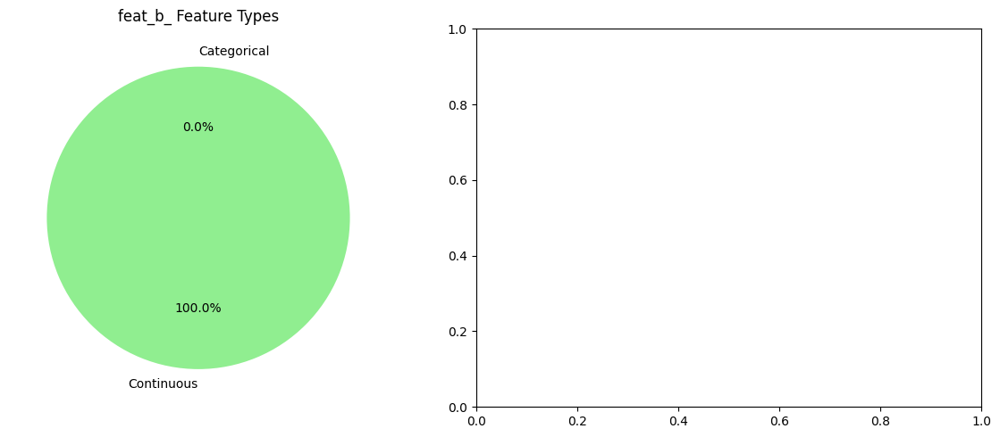

feat_b_ 그룹 분석 결과:
  - 총 feature 수: 6
  - 범주형: 0개
  - 연속형: 6개



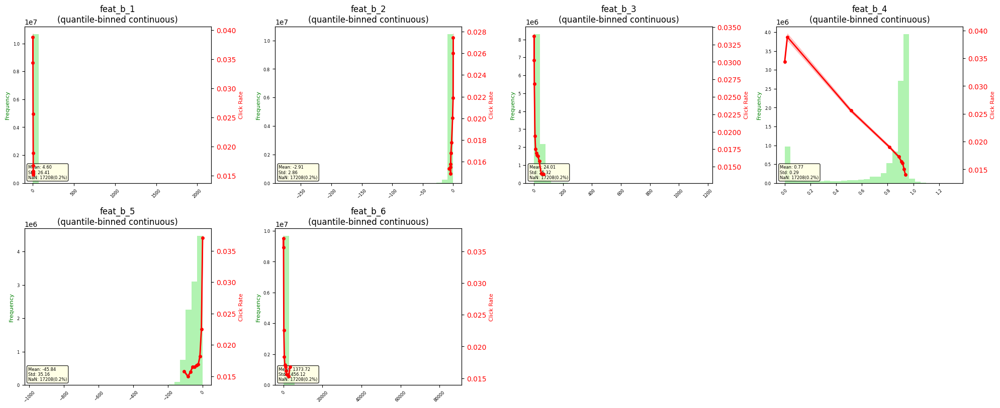


'feat_b_' feature statistics:
feat_b_1       : 6075 unique, 17,208 nulls
feat_b_2       : 2821 unique, 17,208 nulls
feat_b_3       : 15151 unique, 17,208 nulls
feat_b_4       : 127 unique, 17,208 nulls
feat_b_5       : 14134 unique, 17,208 nulls
feat_b_6       : 80769 unique, 17,208 nulls
변환된 DataFrame의 모든 컬럼들: ['clicked', 'feat_b_1', 'feat_b_2', 'feat_b_3', 'feat_b_4', 'feat_b_5', 'feat_b_6', 'feat_b_1_w_log1p', 'feat_b_2_w_asinh', 'feat_b_3_w_log1p', 'feat_b_4_w_logit', 'feat_b_5_w_asinh', 'feat_b_6_w_rg']
변환된 feat_b_ DataFrame 크기: (10704179, 7)


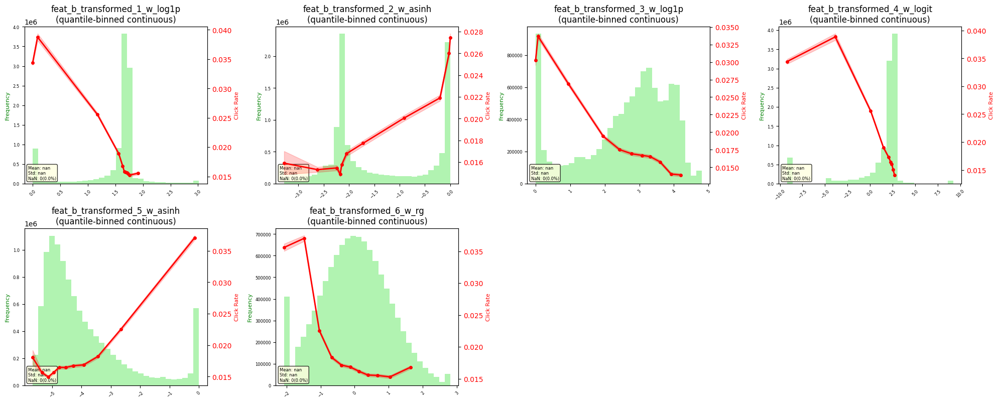


'feat_b_transformed_' feature statistics:
feat_b_transformed_1_w_log1p: 1880 unique, 0 nulls
feat_b_transformed_2_w_asinh: 1103 unique, 0 nulls
feat_b_transformed_3_w_log1p: 6529 unique, 0 nulls
feat_b_transformed_4_w_logit:  99 unique, 0 nulls
feat_b_transformed_5_w_asinh: 8248 unique, 0 nulls
feat_b_transformed_6_w_rg: 61474 unique, 0 nulls


In [75]:
# feat_b_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'feat_b_')

# feat_b_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'feat_b_', rows=7, cols=4, figsize=(20, 28), bins=10)

# feat_b_ 연속형 분포 변형
# feat_b_transformed_df, summary = create_transformed_features_df(train_rawdf, 'feat_b_', 'auto')
feat_b_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'feat_b_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('feat_b_', 'feat_b_transformed_') for col in feat_b_transformed_df.columns if col != 'clicked'}
feat_b_transformed_df = feat_b_transformed_df.rename(rename_dict)
plot_feature_group_quantile(feat_b_transformed_df, 'feat_b_transformed_', rows=7, cols=4, figsize=(20, 28), bins=10)

#### feat_c_*
- 정보영역피쳐 c

In [76]:
feat_c_cols = [col for col in train_rawdf.columns if col.startswith('feat_c')]
train_rawdf[feat_c_cols].head(10)

feat_c_1,feat_c_2,feat_c_3,feat_c_4,feat_c_5,feat_c_6,feat_c_7,feat_c_8
f32,f32,f32,f32,f32,f32,f32,f32
58.840435,0.043634,66.696426,28.672052,45.806812,7.606154,73.891685,26.482759
58.840435,0.062986,23.371054,28.672052,31.121622,7.223301,73.891685,24.990477
58.840435,0.03367,43.445312,28.672052,41.673958,7.606154,73.891685,27.473171
58.840435,0.028374,71.821548,28.314625,45.058998,7.59322,73.891685,27.278688
58.840435,1.360358,32.535999,27.65464,37.915966,7.081967,73.891685,22.755556
57.106171,0.055467,70.94017,28.672052,45.218777,7.865237,73.891685,27.362318
58.346863,1.05679,54.91729,28.672052,45.218777,7.145631,73.891685,21.333334
58.346863,0.129962,32.646667,24.380531,32.485294,5.142857,62.78788,11.862069
58.840435,35.999809,32.535999,28.314625,40.716579,7.223301,73.891685,29.104073


In [ ]:
train_rawdf.select(feat_c_cols).describe()

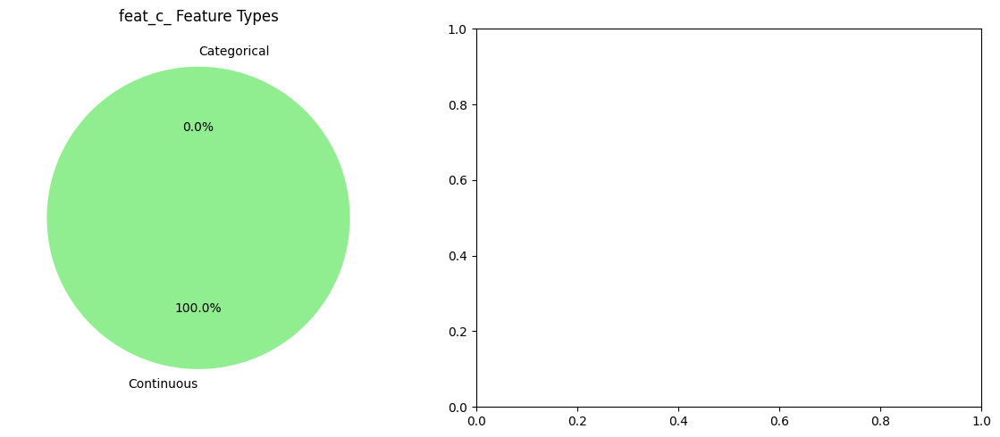

feat_c_ 그룹 분석 결과:
  - 총 feature 수: 8
  - 범주형: 0개
  - 연속형: 8개



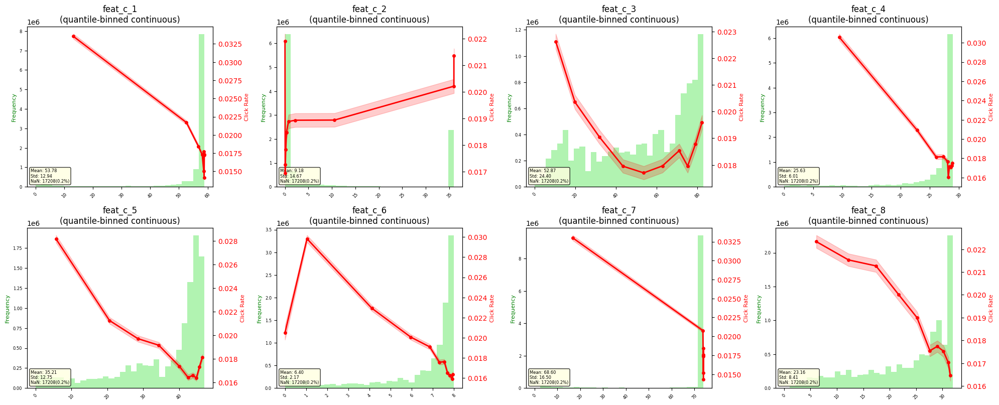


'feat_c_' feature statistics:
feat_c_1       : 491 unique, 17,208 nulls
feat_c_2       : 4806603 unique, 17,208 nulls
feat_c_3       : 664 unique, 17,208 nulls
feat_c_4       : 553 unique, 17,208 nulls
feat_c_5       : 631 unique, 17,208 nulls
feat_c_6       : 494 unique, 17,208 nulls
feat_c_7       : 436 unique, 17,208 nulls
feat_c_8       : 638 unique, 17,208 nulls
변환된 DataFrame의 모든 컬럼들: ['clicked', 'feat_c_1', 'feat_c_2', 'feat_c_3', 'feat_c_4', 'feat_c_5', 'feat_c_6', 'feat_c_7', 'feat_c_8', 'feat_c_1_w_rg', 'feat_c_2_w_log1p', 'feat_c_3_w_robust', 'feat_c_4_w_rg', 'feat_c_5_w_rg', 'feat_c_6_w_rg', 'feat_c_7_w_rg', 'feat_c_8_w_robust']
변환된 feat_c_ DataFrame 크기: (10704179, 9)


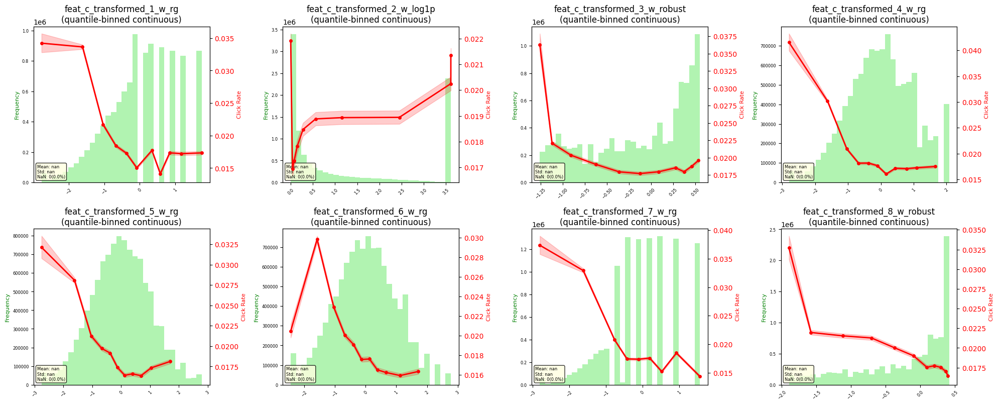


'feat_c_transformed_' feature statistics:
feat_c_transformed_1_w_rg: 472 unique, 0 nulls
feat_c_transformed_2_w_log1p: 4739875 unique, 0 nulls
feat_c_transformed_3_w_robust: 624 unique, 0 nulls
feat_c_transformed_4_w_rg: 524 unique, 0 nulls
feat_c_transformed_5_w_rg: 615 unique, 0 nulls
feat_c_transformed_6_w_rg: 494 unique, 0 nulls
feat_c_transformed_7_w_rg: 412 unique, 0 nulls
feat_c_transformed_8_w_robust: 588 unique, 0 nulls


In [77]:
# feat_c_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'feat_c_')

# feat_c_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'feat_c_', rows=7, cols=4, figsize=(20, 28), bins=10)

# feat_c_ 연속형 분포 변형
# feat_c_transformed_df, summary = create_transformed_features_df(train_rawdf, 'feat_c_', 'auto')   
feat_c_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'feat_c_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('feat_c_', 'feat_c_transformed_') for col in feat_c_transformed_df.columns if col != 'clicked'}
feat_c_transformed_df = feat_c_transformed_df.rename(rename_dict)
plot_feature_group_quantile(feat_c_transformed_df, 'feat_c_transformed_', rows=7, cols=4, figsize=(20, 28), bins=10)

#### feat_d_*
- 정보영역피쳐 d

In [78]:
feat_d_cols = [col for col in train_rawdf.columns if col.startswith('feat_d')]
train_rawdf[feat_d_cols].head(10)

feat_d_1,feat_d_2,feat_d_3,feat_d_4,feat_d_5,feat_d_6
f32,f32,f32,f32,f32,f32
0.38961,2.0,1.764706,1.444444,-0.30303,-0.422535
0.38961,2.0,1.764706,12.865979,-0.30303,-0.422535
0.38961,2.0,1.764706,15.954545,-0.222222,-0.394366
0.38961,2.0,1.764706,23.475729,-0.30303,-0.422535
0.38961,2.0,1.764706,3.759036,-0.282828,-0.422535
0.38961,1.866667,1.705882,6.09375,-0.30303,-0.408451
0.38961,2.0,0.058824,3.416058,-0.30303,-0.422535
0.38961,0.066667,0.941176,0.0,-0.050505,-0.225352
0.376623,1.933333,1.764706,14.444445,-0.292929,-0.422535


In [ ]:
train_rawdf.select(feat_d_cols).describe()

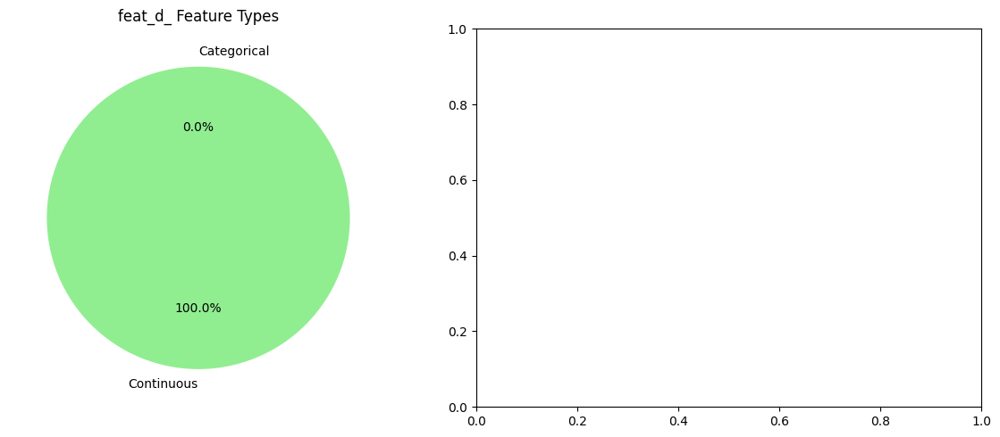

feat_d_ 그룹 분석 결과:
  - 총 feature 수: 6
  - 범주형: 0개
  - 연속형: 6개



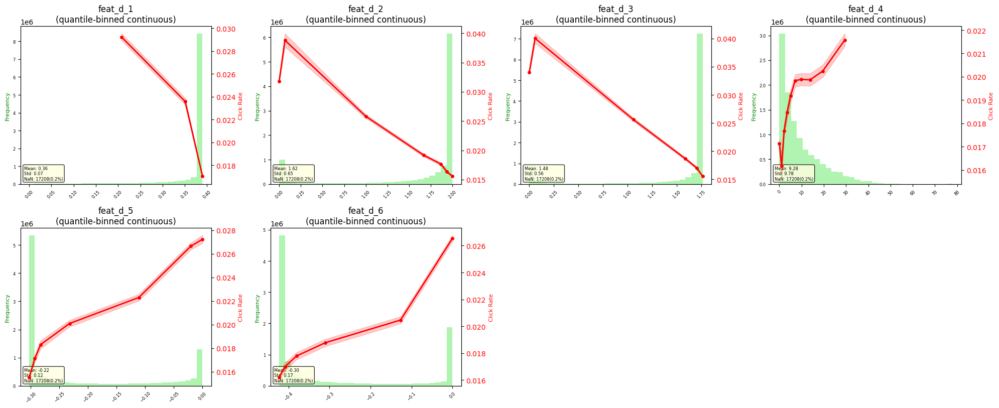


'feat_d_' feature statistics:
feat_d_1       :  32 unique, 17,208 nulls
feat_d_2       :  32 unique, 17,208 nulls
feat_d_3       :  32 unique, 17,208 nulls
feat_d_4       : 80488 unique, 17,208 nulls
feat_d_5       :  32 unique, 17,208 nulls
feat_d_6       :  32 unique, 17,208 nulls
변환된 DataFrame의 모든 컬럼들: ['clicked', 'feat_d_1', 'feat_d_2', 'feat_d_3', 'feat_d_4', 'feat_d_5', 'feat_d_6', 'feat_d_1_w_logit', 'feat_d_2_w_rg', 'feat_d_3_w_rg', 'feat_d_4_w_log1p', 'feat_d_5_w_asinh', 'feat_d_6_w_asinh']
변환된 feat_d_ DataFrame 크기: (10704179, 7)


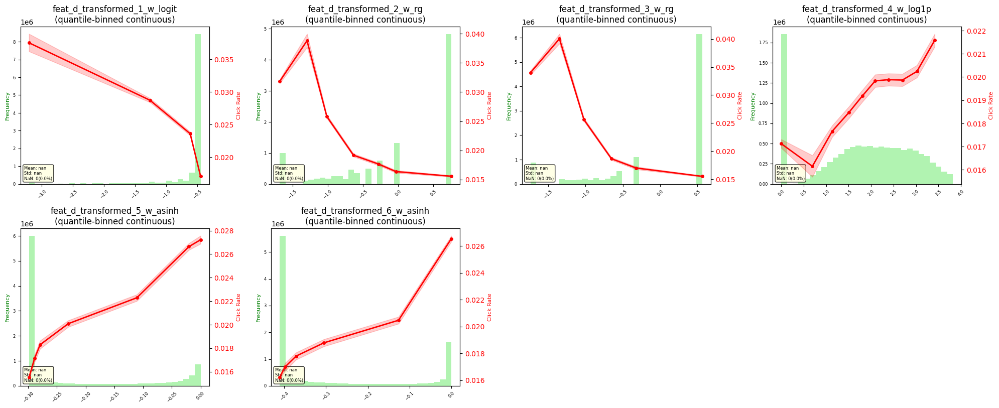


'feat_d_transformed_' feature statistics:
feat_d_transformed_1_w_logit:  29 unique, 0 nulls
feat_d_transformed_2_w_rg:  32 unique, 0 nulls
feat_d_transformed_3_w_rg:  32 unique, 0 nulls
feat_d_transformed_4_w_log1p: 76159 unique, 0 nulls
feat_d_transformed_5_w_asinh:  32 unique, 0 nulls
feat_d_transformed_6_w_asinh:  32 unique, 0 nulls


In [79]:
# feat_d_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'feat_d_')

# feat_d_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'feat_d_', rows=7, cols=4, figsize=(20, 28), bins=10)

# feat_d_ 연속형 분포 변형
# feat_d_transformed_df, summary = create_transformed_features_df(train_rawdf, 'feat_d_', 'auto')
feat_d_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'feat_d_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('feat_d_', 'feat_d_transformed_') for col in feat_d_transformed_df.columns if col != 'clicked'}
feat_d_transformed_df = feat_d_transformed_df.rename(rename_dict)
plot_feature_group_quantile(feat_d_transformed_df, 'feat_d_transformed_', rows=7, cols=4, figsize=(20, 28), bins=10)

#### feat_e_*
- 정보영역피쳐 e

In [80]:
feat_e_cols = [col for col in train_rawdf.columns if col.startswith('feat_e')]
train_rawdf[feat_e_cols].head(10)

feat_e_1,feat_e_2,feat_e_3,feat_e_4,feat_e_5,feat_e_6,feat_e_7,feat_e_8,feat_e_9,feat_e_10
f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
65.0,-4230.666504,23.863636,-0.05,0.019608,-0.012987,0.625,-242.488892,-0.612903,-436.228577
65.0,-1346.648193,4.545455,-0.05,0.019608,-0.012987,104.6875,-194.066666,-52.709679,-390.728577
64.638885,-3195.388916,22.727272,-0.05,0.019608,-0.051948,13.6875,-305.844452,-12.67742,-600.885742
65.0,-4029.962891,3.863636,-0.05,0.019608,-0.142857,163.75,-256.444458,-54.7957,-523.599976
65.0,-2106.407471,8.522727,-0.05,0.019608,-0.077922,22.3125,-173.577774,-4.967742,-176.971436
65.0,-1488.648193,3.977273,-0.05,-0.019608,-0.025974,53.3125,-112.644447,-12.354838,-134.800003
64.277779,-455.555542,4.545455,-0.05,-0.019608,-0.025974,20.6875,-61.422222,-3.881721,-52.442856
63.555557,-1871.703735,22.727272,-0.05,-0.039216,-0.12987,16.5,-286.444458,-30.010754,-803.471436
65.0,-1466.148193,5.681818,-0.05,0.019608,-0.116883,36.5625,-229.711105,-14.537635,-389.257141


In [87]:
train_rawdf.select(feat_e_cols).describe()

statistic,feat_e_1,feat_e_2,feat_e_3,feat_e_4,feat_e_5,feat_e_6,feat_e_7,feat_e_8,feat_e_9,feat_e_10
str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""count""",1.0686971e7,1.0686971e7,9.618622e6,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7,1.0686971e7
"""null_count""",17208.0,17208.0,1.085557e6,17208.0,17208.0,17208.0,17208.0,17208.0,17208.0,17208.0
"""mean""",61.126118,-2571.00293,9.881564,-0.049465,-0.055636,-0.064757,46.394314,-186.49765,-18.980108,-303.930511
"""std""",9.928541,2280.959717,11.146504,0.00534,0.110146,0.075778,70.314514,120.824127,26.881636,209.896301
"""min""",0.361111,-311604.25,1.136364,-0.1,-2.431373,-1.701299,-0.0625,-783.755554,-587.677429,-2391.942871
"""25%""",63.555557,-3852.444336,3.409091,-0.05,-0.098039,-0.090909,3.25,-263.666656,-25.053764,-434.585724
"""50%""",65.0,-2288.370361,5.454545,-0.05,-0.019608,-0.038961,21.375,-172.222229,-10.193548,-268.828583
"""75%""",65.0,-852.09259,10.227273,-0.05,0.019608,-0.012987,59.3125,-89.599998,-2.344086,-133.471436
"""max""",65.0,18073.945312,170.454544,0.0,0.019608,0.012987,1277.375,0.022222,0.010753,0.014286


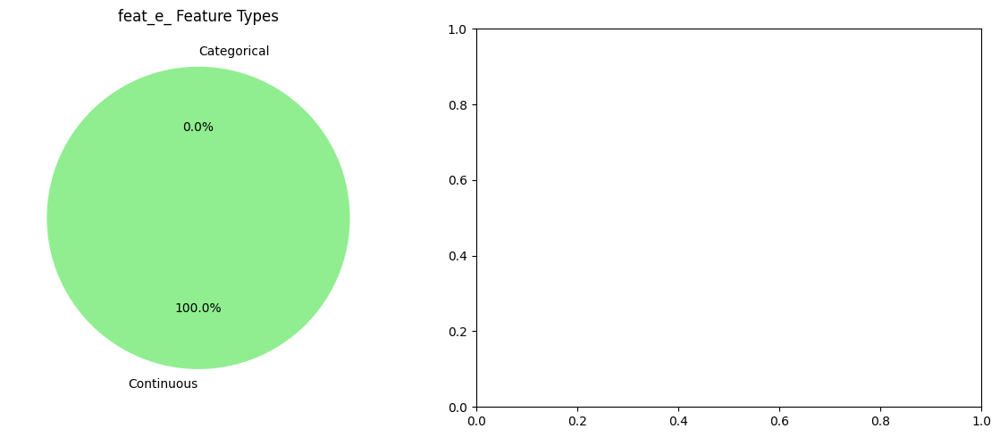

feat_e_ 그룹 분석 결과:
  - 총 feature 수: 10
  - 범주형: 0개
  - 연속형: 10개



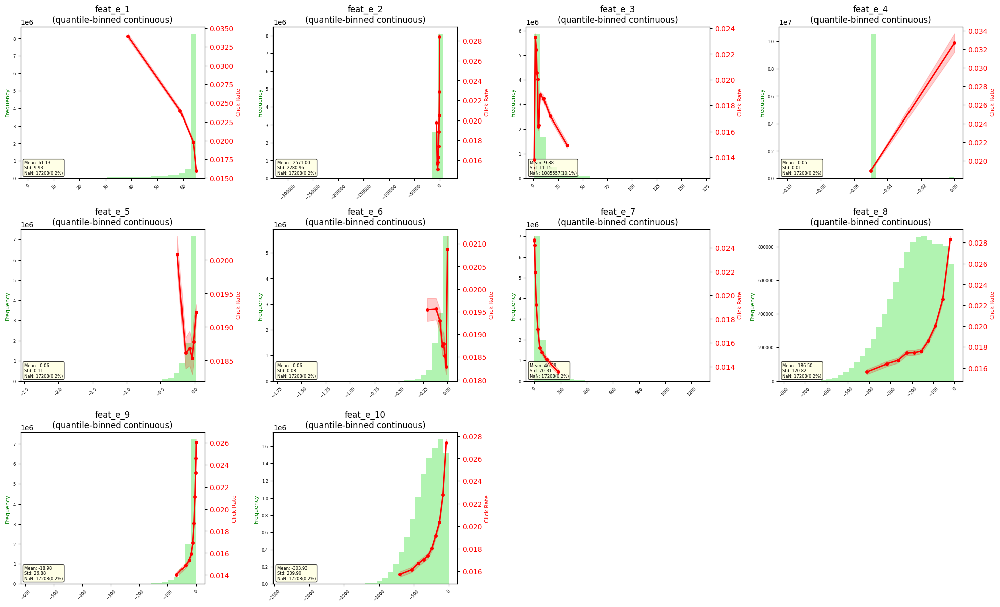


'feat_e_' feature statistics:
feat_e_1       : 181 unique, 17,208 nulls
feat_e_2       : 484192 unique, 17,208 nulls
feat_e_3       : 106 unique, 1,085,557 nulls
feat_e_4       :   5 unique, 17,208 nulls
feat_e_5       : 122 unique, 17,208 nulls
feat_e_6       : 120 unique, 17,208 nulls
feat_e_7       : 12152 unique, 17,208 nulls
feat_e_8       : 29757 unique, 17,208 nulls
feat_e_9       : 25470 unique, 17,208 nulls
feat_e_10      : 77630 unique, 17,208 nulls
변환된 DataFrame의 모든 컬럼들: ['clicked', 'feat_e_1', 'feat_e_2', 'feat_e_3', 'feat_e_4', 'feat_e_5', 'feat_e_6', 'feat_e_7', 'feat_e_8', 'feat_e_9', 'feat_e_10', 'feat_e_1_w_rg', 'feat_e_2_w_asinh', 'feat_e_3_w_log1p', 'feat_e_4_w_asinh', 'feat_e_5_w_asinh', 'feat_e_6_w_asinh', 'feat_e_7_w_log1p', 'feat_e_8_w_asinh', 'feat_e_9_w_asinh', 'feat_e_10_w_asinh']
변환된 feat_e_ DataFrame 크기: (10704179, 11)


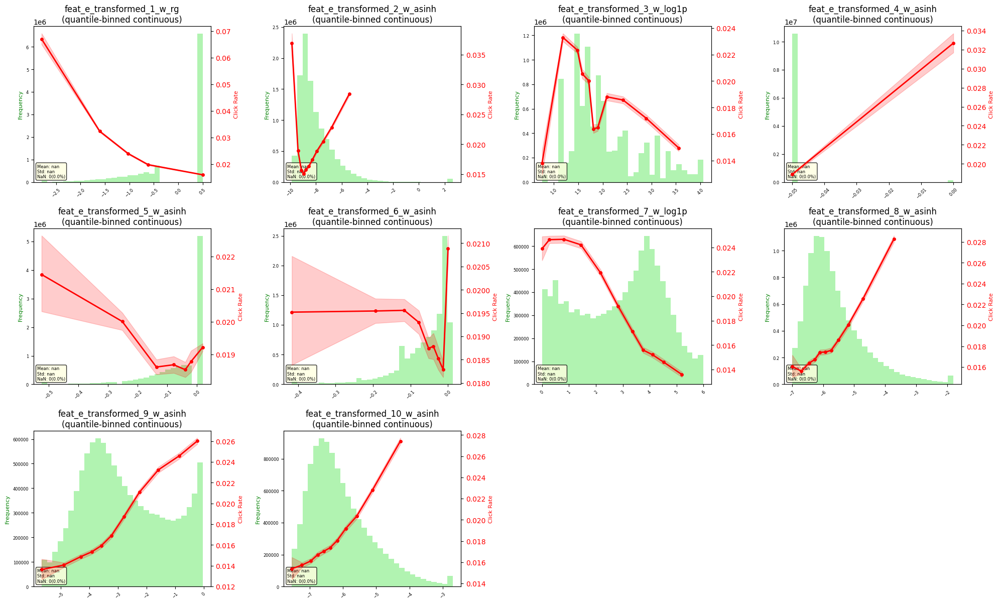


'feat_e_transformed_' feature statistics:
feat_e_transformed_1_w_rg: 160 unique, 0 nulls
feat_e_transformed_2_w_asinh: 437841 unique, 0 nulls
feat_e_transformed_3_w_log1p:  97 unique, 0 nulls
feat_e_transformed_4_w_asinh:   3 unique, 0 nulls
feat_e_transformed_5_w_asinh:  30 unique, 0 nulls
feat_e_transformed_6_w_asinh:  36 unique, 0 nulls
feat_e_transformed_7_w_log1p: 6356 unique, 0 nulls
feat_e_transformed_8_w_asinh: 24348 unique, 0 nulls
feat_e_transformed_9_w_asinh: 13449 unique, 0 nulls
feat_e_transformed_10_w_asinh: 65388 unique, 0 nulls


In [81]:
# feat_e_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'feat_e_')

# feat_e_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'feat_e_', rows=7, cols=4, figsize=(20, 28), bins=10)

# feat_e_ 연속형 분포 변형
# feat_e_transformed_df, summary = create_transformed_features_df(train_rawdf, 'feat_e_', 'auto')
feat_e_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'feat_e_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('feat_e_', 'feat_e_transformed_') for col in feat_e_transformed_df.columns if col != 'clicked'}
feat_e_transformed_df = feat_e_transformed_df.rename(rename_dict)
plot_feature_group_quantile(feat_e_transformed_df, 'feat_e_transformed_', rows=7, cols=4, figsize=(20, 28), bins=10)

#### history_a_*
- 과거 인기도 피처
- 0에서 가까울수록 가까운 과거

In [82]:
history_a_cols = [col for col in train_rawdf.columns if col.startswith('history_a')]
train_rawdf[history_a_cols].head(10)

history_a_1,history_a_2,history_a_3,history_a_4,history_a_5,history_a_6,history_a_7
f32,f32,f32,f32,f32,f32,f32
0.032765,-0.055556,0.02439,-326.857147,-0.014493,-183.285721,-13.596154
0.00934,0.0,0.0,-382.285706,0.0,-176.0,-11.442307
0.078562,-0.111111,0.097561,-409.0,-0.014493,-224.714279,-13.942307
0.039023,-0.055556,0.02439,-274.428558,-0.014493,-127.85714,-9.846154
0.00876,0.0,0.0,-407.571442,0.0,-199.142853,-14.019231
0.020297,-0.055556,0.02439,-527.714294,-0.014493,-260.428558,-17.557692
0.076687,-0.055556,0.085366,-372.428558,0.0,-161.857147,-11.826923
0.15121,-0.111111,0.02439,-70.714287,0.0,-40.285713,-2.307692
0.03723,0.0,0.012195,-191.714279,0.0,-84.85714,-5.423077


In [ ]:
train_rawdf.select(history_a_cols).describe()

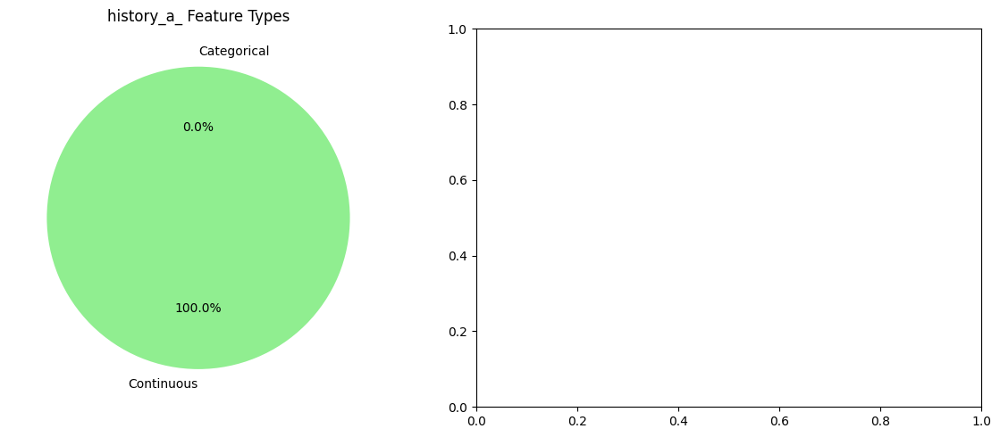

history_a_ 그룹 분석 결과:
  - 총 feature 수: 7
  - 범주형: 0개
  - 연속형: 7개



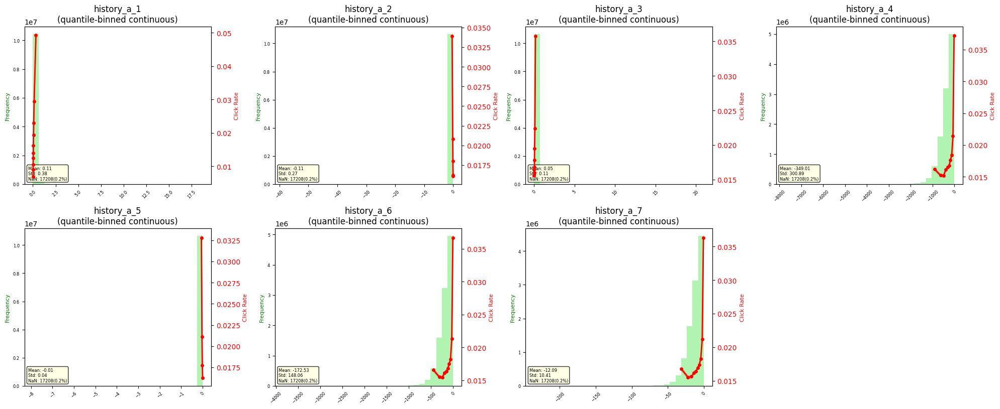


'history_a_' feature statistics:
history_a_1    : 96221 unique, 17,208 nulls
history_a_2    : 256 unique, 17,208 nulls
history_a_3    : 419 unique, 17,208 nulls
history_a_4    : 15915 unique, 17,208 nulls
history_a_5    : 166 unique, 17,208 nulls
history_a_6    : 8702 unique, 17,208 nulls
history_a_7    : 4991 unique, 17,208 nulls
변환된 DataFrame의 모든 컬럼들: ['clicked', 'history_a_1', 'history_a_2', 'history_a_3', 'history_a_4', 'history_a_5', 'history_a_6', 'history_a_7', 'history_a_1_w_log1p', 'history_a_2_w_asinh', 'history_a_3_w_logit', 'history_a_4_w_asinh', 'history_a_5_w_asinh', 'history_a_6_w_asinh', 'history_a_7_w_asinh']
변환된 history_a_ DataFrame 크기: (10704179, 8)


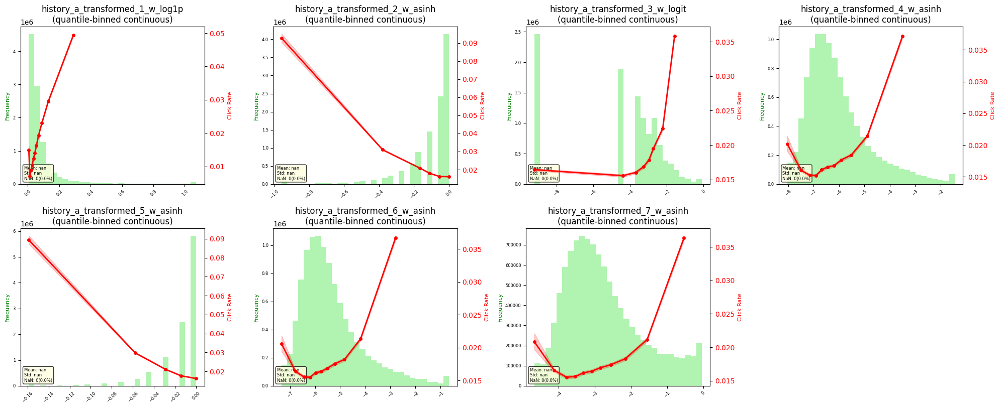


'history_a_transformed_' feature statistics:
history_a_transformed_1_w_log1p: 94172 unique, 0 nulls
history_a_transformed_2_w_asinh:  22 unique, 0 nulls
history_a_transformed_3_w_logit:  41 unique, 0 nulls
history_a_transformed_4_w_asinh: 10837 unique, 0 nulls
history_a_transformed_5_w_asinh:  13 unique, 0 nulls
history_a_transformed_6_w_asinh: 5341 unique, 0 nulls
history_a_transformed_7_w_asinh: 2780 unique, 0 nulls


In [83]:
# history_a_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'history_a_')

# history_a_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'history_a_', rows=7, cols=4, figsize=(20, 28), bins=10)

# history_a_ 연속형 분포 변형
# history_a_transformed_df, summary = create_transformed_features_df(train_rawdf, 'history_a_', 'auto')
history_a_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'history_a_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('history_a_', 'history_a_transformed_') for col in history_a_transformed_df.columns if col != 'clicked'}
history_a_transformed_df = history_a_transformed_df.rename(rename_dict)
plot_feature_group_quantile(history_a_transformed_df, 'history_a_transformed_', rows=7, cols=4, figsize=(20, 28), bins=10)

#### history_b_*
- 과거 피처
- 0에서 가까울수록 가까운 과거

In [84]:
history_b_cols = [col for col in train_rawdf.columns if col.startswith('history_b')]
train_rawdf[history_b_cols].head(10)

history_b_1,history_b_2,history_b_3,history_b_4,history_b_5,history_b_6,history_b_7,history_b_8,history_b_9,history_b_10,history_b_11,history_b_12,history_b_13,history_b_14,history_b_15,history_b_16,history_b_17,history_b_18,history_b_19,history_b_20,history_b_21,history_b_22,history_b_23,history_b_24,history_b_25,history_b_26,history_b_27,history_b_28,history_b_29,history_b_30
f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
0.115821,0.138626,0.047507,0.050622,0.026479,0.001558,0.024922,0.051401,0.004673,0.021028,0.072428,0.007009,0.028816,0.05841,0.000779,0.072428,0.016355,0.011682,0.010124,0.002336,0.008567,0.070092,0.070092,0.011682,0.004673,0.087226,0.049843,0.015576,0.040498,0.051401
0.068794,0.072179,0.049471,0.052715,0.027574,0.001622,0.025952,0.053526,0.004866,0.021897,0.075423,0.007299,0.030007,0.060825,0.000811,0.075423,0.017031,0.012165,0.010543,0.002433,0.008921,0.07299,0.07299,0.012165,0.004866,0.045416,0.051904,0.01622,0.042172,0.026763
0.112947,0.169634,0.038753,0.041295,0.0216,0.001271,0.02033,0.04193,0.003812,0.017153,0.059083,0.005718,0.023506,0.047647,0.000635,0.059083,0.026683,0.00953,0.008259,0.001906,0.006988,0.057177,0.057177,0.00953,0.003812,0.035577,0.081318,0.012706,0.033036,0.062898
0.159843,0.198657,0.068082,0.072546,0.037947,0.002232,0.035715,0.073663,0.006697,0.030135,0.103797,0.010045,0.041296,0.083707,0.002232,0.103797,0.023438,0.016741,0.014509,0.003348,0.012277,0.100449,0.100449,0.016741,0.006697,0.062502,0.07143,0.022322,0.058037,0.073659
0.056166,0.063795,0.043725,0.046592,0.024371,0.001434,0.022938,0.047309,0.004301,0.019354,0.066662,0.006451,0.026522,0.05376,0.000717,0.066662,0.015053,0.010752,0.009318,0.00215,0.007885,0.064512,0.064512,0.010752,0.004301,0.040141,0.045875,0.014336,0.037274,0.023654
0.089716,0.097589,0.03344,0.035633,0.018639,0.001096,0.017542,0.036181,0.003289,0.014801,0.050983,0.004934,0.020283,0.041115,0.000548,0.050983,0.011512,0.008223,0.007127,0.001645,0.00603,0.049338,0.049338,0.008223,0.003289,0.030699,0.035085,0.02193,0.028506,0.036185
0.066559,0.156969,0.05379,0.057317,0.029981,0.001764,0.028218,0.058199,0.005291,0.023809,0.082007,0.007936,0.032627,0.066135,0.000882,0.082007,0.018518,0.013227,0.011463,0.002645,0.0097,0.079362,0.079362,0.013227,0.005291,0.049381,0.056435,0.035274,0.045854,0.058202
0.338845,0.943462,0.431093,0.459361,0.120142,0.007067,0.113075,0.233218,0.021202,0.095407,0.328625,0.031802,0.130743,0.26502,0.003534,0.328625,0.074206,0.053004,0.045937,0.010601,0.03887,0.318024,0.318024,0.053004,0.021202,0.395758,0.22615,0.070672,0.183747,0.233214
0.144878,0.149582,0.102523,0.109246,0.057144,0.003361,0.053782,0.110926,0.010084,0.045379,0.156305,0.015126,0.062186,0.126052,0.001681,0.156305,0.035295,0.02521,0.021849,0.005042,0.018488,0.151263,0.151263,0.02521,0.010084,0.094119,0.107565,0.033614,0.087396,0.055463


In [ ]:
train_rawdf.select(history_b_cols).describe()

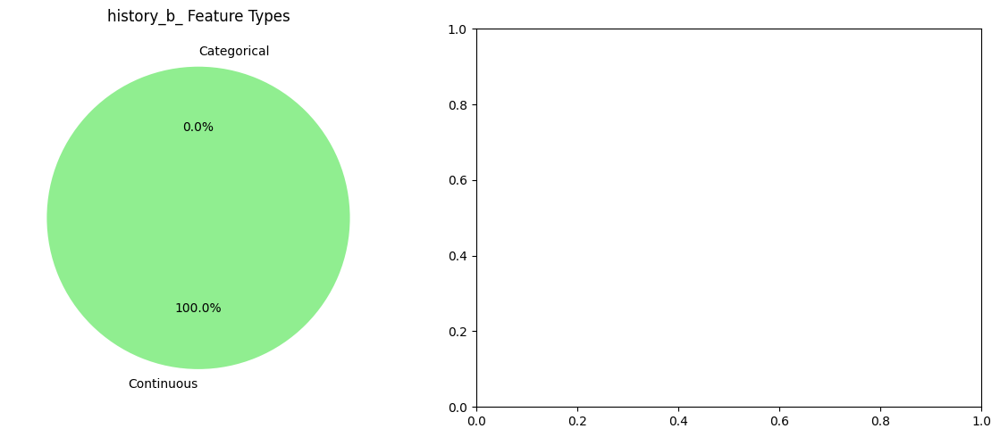

history_b_ 그룹 분석 결과:
  - 총 feature 수: 30
  - 범주형: 0개
  - 연속형: 30개



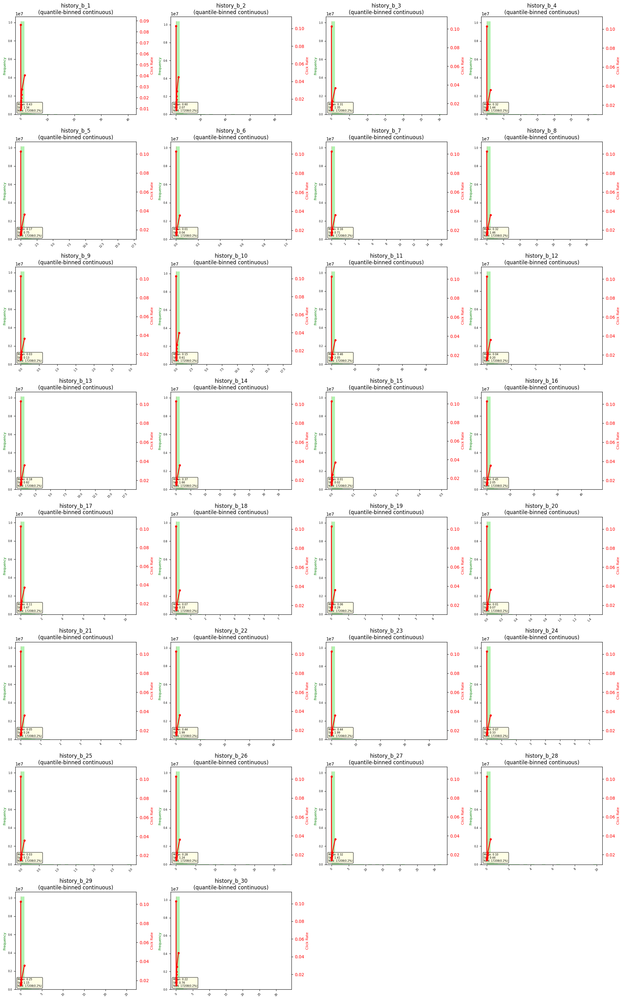


'history_b_' feature statistics:
history_b_1    : 33641 unique, 17,208 nulls
history_b_2    : 64421 unique, 17,208 nulls
history_b_3    : 22462 unique, 17,208 nulls
history_b_4    : 13301 unique, 17,208 nulls
history_b_5    : 15105 unique, 17,208 nulls
history_b_6    : 8815 unique, 17,208 nulls
history_b_7    : 10926 unique, 17,208 nulls
history_b_8    : 11259 unique, 17,208 nulls
history_b_9    : 20885 unique, 17,208 nulls
history_b_10   : 39909 unique, 17,208 nulls
history_b_11   : 10021 unique, 17,208 nulls
history_b_12   : 16445 unique, 17,208 nulls
history_b_13   : 14579 unique, 17,208 nulls
history_b_14   : 12370 unique, 17,208 nulls
history_b_15   : 22793 unique, 17,208 nulls
history_b_16   : 6188 unique, 17,208 nulls
history_b_17   : 22462 unique, 17,208 nulls
history_b_18   : 7258 unique, 17,208 nulls
history_b_19   : 13624 unique, 17,208 nulls
history_b_20   : 15941 unique, 17,208 nulls
history_b_21   : 5813 unique, 17,208 nulls
history_b_22   : 11001 unique, 17,208 nulls
hi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:   11.2s


변환된 DataFrame의 모든 컬럼들: ['clicked', 'history_b_1', 'history_b_2', 'history_b_3', 'history_b_4', 'history_b_5', 'history_b_6', 'history_b_7', 'history_b_8', 'history_b_9', 'history_b_10', 'history_b_11', 'history_b_12', 'history_b_13', 'history_b_14', 'history_b_15', 'history_b_16', 'history_b_17', 'history_b_18', 'history_b_19', 'history_b_20', 'history_b_21', 'history_b_22', 'history_b_23', 'history_b_24', 'history_b_25', 'history_b_26', 'history_b_27', 'history_b_28', 'history_b_29', 'history_b_30', 'history_b_1_w_log1p', 'history_b_2_w_log1p', 'history_b_3_w_log1p', 'history_b_4_w_log1p', 'history_b_5_w_log1p', 'history_b_6_w_logit', 'history_b_7_w_log1p', 'history_b_8_w_log1p', 'history_b_9_w_logit', 'history_b_10_w_log1p', 'history_b_11_w_log1p', 'history_b_12_w_logit', 'history_b_13_w_log1p', 'history_b_14_w_log1p', 'history_b_15_w_logit', 'history_b_16_w_log1p', 'history_b_17_w_log1p', 'history_b_18_w_log1p', 'history_b_19_w_log1p', 'history_b_20_w_logit', 'history_b_21_w_logit',

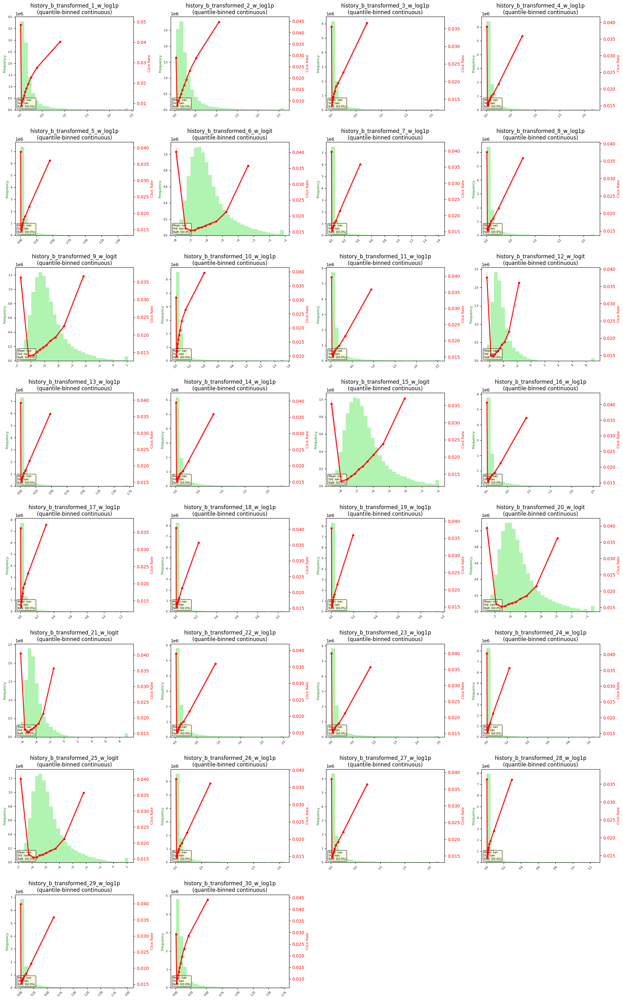


'history_b_transformed_' feature statistics:
history_b_transformed_1_w_log1p: 32206 unique, 0 nulls
history_b_transformed_2_w_log1p: 62605 unique, 0 nulls
history_b_transformed_3_w_log1p: 21352 unique, 0 nulls
history_b_transformed_4_w_log1p: 12310 unique, 0 nulls
history_b_transformed_5_w_log1p: 14125 unique, 0 nulls
history_b_transformed_6_w_logit: 7863 unique, 0 nulls
history_b_transformed_7_w_log1p: 9963 unique, 0 nulls
history_b_transformed_8_w_log1p: 10278 unique, 0 nulls
history_b_transformed_9_w_logit: 19810 unique, 0 nulls
history_b_transformed_10_w_log1p: 38556 unique, 0 nulls
history_b_transformed_11_w_log1p: 9053 unique, 0 nulls
history_b_transformed_12_w_logit: 15442 unique, 0 nulls
history_b_transformed_13_w_log1p: 13598 unique, 0 nulls
history_b_transformed_14_w_log1p: 11400 unique, 0 nulls
history_b_transformed_15_w_logit: 21741 unique, 0 nulls
history_b_transformed_16_w_log1p: 5235 unique, 0 nulls
history_b_transformed_17_w_log1p: 21366 unique, 0 nulls
history_b_trans

In [85]:
# history_b_ 그룹 타입 분석
plot_feature_type_analysis(train_rawdf, 'history_b_')

# history_b_ 원본 분포 확인
plot_feature_group_quantile(train_rawdf, 'history_b_', rows=8, cols=4, figsize=(20, 32), bins=10)

# history_b_ 연속형 분포 변형
# history_b_transformed_df, summary = create_transformed_features_df(train_rawdf, 'history_b_', 'auto')
history_b_transformed_df, summary = create_transformed_features_df_fast(train_rawdf, 'history_b_', 'auto', winsorize_p=0.005)
rename_dict = {col: col.replace('history_b_', 'history_b_transformed_') for col in history_b_transformed_df.columns if col != 'clicked'}
history_b_transformed_df = history_b_transformed_df.rename(rename_dict)
plot_feature_group_quantile(history_b_transformed_df, 'history_b_transformed_', rows=8, cols=4, figsize=(20, 32), bins=10)

# Missing Values

In [5]:
original_rows = train.shape[0]

# NULL이 있는 행을 제거한 후의 행 수
clean_rows = train.drop_nulls().shape[0]

# 제거된 행 수 계산
removed_rows = original_rows - clean_rows
print(f"원본 행 수: {original_rows}")
print(f"NULL 제거 후 행 수: {clean_rows}")
print(f"제거된 행 수: {removed_rows}")

원본 행 수: 10704179
NULL 제거 후 행 수: 9611653
제거된 행 수: 1092526


In [6]:
# 올바른 NULL 제거 로직 수정
# feat_e_3를 제외한 모든 컬럼에서 NULL 체크
columns_to_check = [col for col in train.columns if col != 'feat_e_3']

# 원본 행 수 확인
original_rows = train.shape[0]

# feat_e_3을 제외하고 NULL이 있는 행 제거 후 남은 행 수
clean_data = train.drop_nulls(subset=columns_to_check)
clean_rows = clean_data.shape[0]

# 제거된 행 수
removed_rows = original_rows - clean_rows
print(f"원본 행 수: {original_rows}")
print(f"feat_e_3 제외하고 NULL 제거 후 행 수: {clean_rows}")
print(f"feat_e_3 제외하고 NULL 제거시 제거되는 행 수: {removed_rows}")

null_expressions = [pl.col(col).is_null() for col in columns_to_check]
removed_data = train.filter(pl.any_horizontal(null_expressions))
removed_rows_clicked_1 = removed_data.filter(pl.col("clicked") == 1).shape[0]

print(f"제거되는 행의 수 중에서 clicked가 1인 것의 개수: {removed_rows_clicked_1}")

원본 행 수: 10704179
feat_e_3 제외하고 NULL 제거 후 행 수: 10685581
feat_e_3 제외하고 NULL 제거시 제거되는 행 수: 18598
제거되는 행의 수 중에서 clicked가 1인 것의 개수: 516


In [7]:
# 컬럼별 결측치 개수 확인
missing_stats = []
for col in train.columns:
    null_count = train[col].null_count()
    null_pct = (null_count / train.height) * 100
    missing_stats.append({
        'column': col,
        'null_count': null_count,
        'null_percentage': null_pct
    })

missing_df = pl.DataFrame(missing_stats).sort("null_count", descending=True)
missing_df_positive = missing_df.filter(pl.col("null_count") > 0)
print("컬럼별 결측치 개수:")

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 0)
pd.set_option("display.max_colwidth", None)

missing_df_positive = missing_df_positive.to_pandas()
display(missing_df_positive)

컬럼별 결측치 개수:


,column,null_count,null_percentage
0,feat_e_3,1085557,10.141432
1,feat_a_1,18598,0.173745
2,feat_a_2,18598,0.173745
3,feat_a_3,18598,0.173745
4,feat_a_4,18598,0.173745
5,feat_a_5,18598,0.173745
6,feat_a_6,18598,0.173745
7,feat_a_7,18598,0.173745
8,feat_a_8,18598,0.173745
9,feat_a_9,18598,0.173745


In [8]:
# feat_a_ 가 결측치
BLOCK_A = [f"feat_a_{i}" for i in range(1,19)]

# 다른 것들이 결측치
BLOCK_other = [
    "gender","age_group","l_feat_2","l_feat_8","l_feat_18","l_feat_19","l_feat_20",
    "l_feat_21","l_feat_22","l_feat_23","l_feat_24",
    "feat_e_1","feat_e_2","feat_e_4","feat_e_5","feat_e_6","feat_e_7","feat_e_8","feat_e_9","feat_e_10",
    *[f"feat_b_{i}" for i in range(1,7)],
    *[f"feat_c_{i}" for i in range(1,9)],
    *[f"feat_d_{i}" for i in range(1,7)],
    *[f"history_a_{i}" for i in range(1,8)],
    *[f"history_b_{i}" for i in range(1,31)]
]

feat_a_all_missing  = pl.all_horizontal([pl.col(c).is_null() for c in BLOCK_A]).cast(pl.Int8)
feat_a_any_missing  = pl.any_horizontal([pl.col(c).is_null() for c in BLOCK_A]).cast(pl.Int8)

other_all_missing   = pl.all_horizontal([pl.col(c).is_null() for c in BLOCK_other]).cast(pl.Int8)
other_any_missing   = pl.any_horizontal([pl.col(c).is_null() for c in BLOCK_other]).cast(pl.Int8)

temp_df = train.with_columns([
    pl.col("feat_e_3").is_null().cast(pl.Int8).alias("feat_e_3_missing"),
    feat_a_all_missing.alias("feat_a_all_missing"),
    feat_a_any_missing.alias("feat_a_any_missing"),
    other_all_missing.alias("other_all_missing"),
    other_any_missing.alias("other_any_missing"),
])

# 조합 카운트 확인
missing_check = (
    temp_df.select(["feat_e_3_missing","feat_a_all_missing","other_all_missing",
                "feat_a_any_missing","other_any_missing"])
       .group_by(["feat_e_3_missing","feat_a_all_missing","other_all_missing",
                  "feat_a_any_missing","other_any_missing"])
       .len()
       .sort("len", descending=True)
)

missing_check


feat_e_3_missing,feat_a_all_missing,other_all_missing,feat_a_any_missing,other_any_missing,len
i8,i8,i8,i8,i8,u32
0,0,0,0,0,9611653
1,0,0,0,0,1073928
1,1,1,1,1,11445
0,1,1,1,1,5763
0,1,0,1,0,1206
1,1,0,1,0,184


- 개별적으로 하나의 column에서만 결측치가 존재하거나 하는 관측치는 없음 → 제거하기보다는 모두 이용하는게 좋아보임
  - feat_a_ 만 통째로 빠져있는 관측치가 1,206 개
  - feat_a_ + feat_e_3 가 통째로 빠져있는 관측치가 184개
  - feat_a_ + other 가 통째로 빠져있는 관측치가 5,763개
    - 여기서 other은 feat_a_, feat_e_3 을 제외한 나머지 column 중 결측치가 존재하는 column을 의미
  - feat_a_ + feat_e_3 + other 가 통재로 빠져있는 관측치가 11,445개
  - feat_e_3 만 통째로 빠져있는 관측치가 1,073,927개

In [9]:
missing_indicator_df = (
    temp_df.group_by(["feat_e_3_missing","feat_a_all_missing","other_all_missing"])
       .agg([
           pl.len().alias("n"),
           pl.col("clicked").mean().alias("ctr")
       ])
       .sort("n", descending=True)
)
display(missing_indicator_df.to_pandas())

,feat_e_3_missing,feat_a_all_missing,other_all_missing,n,ctr
0,0,0,0,9611653,0.019059
1,1,0,0,1073928,0.019065
2,1,1,1,11445,0.017388
3,0,1,1,5763,0.035919
4,0,1,0,1206,0.087065
5,1,1,0,184,0.027174


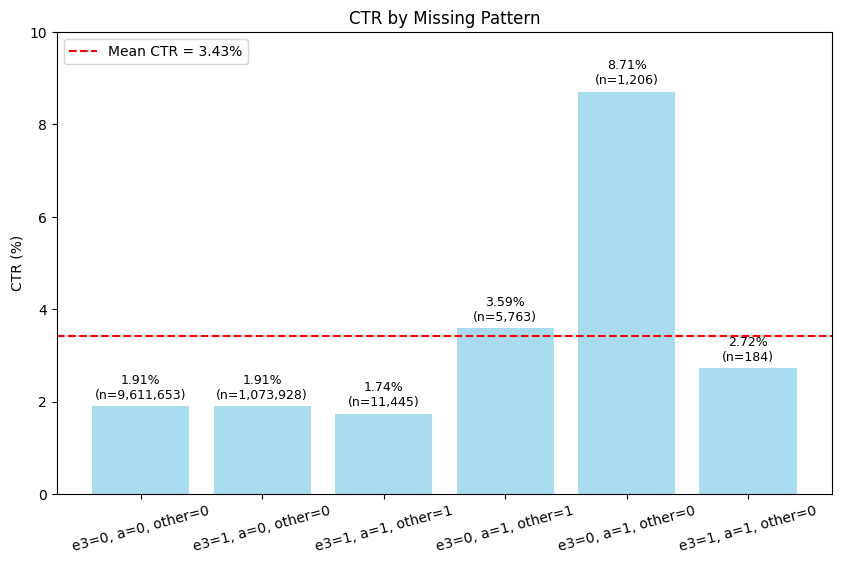

: 

In [ ]:
missing_indicator_df_plot = (
    temp_df.group_by(
        ["feat_e_3_missing","feat_a_all_missing","other_all_missing"]
    ).agg([
        pl.len().alias("n"),
        pl.col("clicked").mean().alias("ctr")
    ]).sort("n", descending=True).to_pandas()
)

missing_indicator_df_plot["label"] = (
    "e3=" + missing_indicator_df_plot["feat_e_3_missing"].astype(str) +
    ", a=" + missing_indicator_df_plot["feat_a_all_missing"].astype(str) +
    ", other=" + missing_indicator_df_plot["other_all_missing"].astype(str)
)

plt.figure(figsize=(10,6))
plt.bar(missing_indicator_df_plot["label"], missing_indicator_df_plot["ctr"]*100, color="skyblue", alpha=0.7)
plt.tick_params(axis="x", rotation=15)
for i, (ctr, n) in enumerate(zip(missing_indicator_df_plot["ctr"], missing_indicator_df_plot["n"])):
    plt.text(i, ctr*100+0.1, f"{ctr*100:.2f}%\n(n={n:,})", ha="center", va="bottom", fontsize=9)

mean_ctr = missing_indicator_df_plot["ctr"].mean()*100
plt.axhline(y=mean_ctr, color="red", linestyle="--", label=f"Mean CTR = {mean_ctr:.2f}%")
plt.ylabel("CTR (%)")
plt.ylim(0, 10)
plt.title("CTR by Missing Pattern")
plt.legend()
plt.show()

# Feature Engineering Ideas

- Add day/time indicator/bin
  - Weekend indicator
  - time_period
- Add cyclic feature
  - day_of_week 
  - hour
  - day_of_week + hour → target encoding
- Add frequency
  - gender frequency
  - inventory frequency
- Add seq related features
  - seq_len
  - seq_first
  - seq_last
- Add interaction terms
  - gender * age_group (성별 연령대)
  - hour * day_of_week (특정 요일의 특정 시간)
  - time_period * day_of_week (특정 요일의 시간대)
  - age_group * time_period (연령대별 시간대)
  - gender * time_period (성별 시간대)
  - inventory_id * age_group (연령대별 지면)
  - inventory_id * gender (성별 지면)
  - seq_length * age_group (연령대별 활동량)
  - seq_length * gender (성별 활동량)